# Start

In [1]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
import umap.umap_ as umap
import os

from Bio import SeqIO
from Bio import SeqUtils
from Bio.SeqUtils import seq3, seq1
from Bio.Seq import Seq
from Bio.Data.CodonTable import unambiguous_dna_by_id
from scipy.spatial.distance import cdist
from scipy.stats import ttest_ind
from scipy.stats import mannwhitneyu as MW
from scipy.stats import fisher_exact
from scipy.stats.contingency import odds_ratio
from scipy.stats import chi2_contingency
from scipy.stats import f_oneway
from scipy.stats import wilcoxon, binomtest
from scipy.stats import tukey_hsd
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from tqdm.notebook import tqdm

MT_VERT_GENCODE = 2

def aa_dict_creator(letters_3: bool = True , codon_table = MT_VERT_GENCODE, full = True):
    aa_dict = {}
    stop_codons = {codon:'_' for codon in unambiguous_dna_by_id[codon_table].stop_codons}
    coding_codons = unambiguous_dna_by_id[codon_table].forward_table
    codon_aa_dict = coding_codons | stop_codons
    for (codon, aa) in codon_aa_dict.items():
        if letters_3:
            aa = seq3(aa)
        if (full == True) and (codon_table==MT_VERT_GENCODE):
            if codon[:2] == 'CT':
                aa = 'Leu1' if letters_3==True else 'L1'
            elif codon == 'TTG' or codon == 'TTA':
                aa = 'Leu2' if letters_3==True else 'L2'
            if codon[:2] == 'TC':
                aa = 'Ser2' if letters_3==True else 'S1'
            elif codon == 'AGT' or codon == 'AGC':
                aa = 'Ser1' if letters_3==True else 'S2'
        if aa not in aa_dict:
            aa_dict[aa] = []
        aa_dict[aa].append(codon)
    return dict(sorted(aa_dict.items()))

aa_dict_full = aa_dict_creator(True)
aa_dict = aa_dict_creator(True, full=False)
Ciona_aa_dict = aa_dict_creator(13)

CODONS=['AAA', 'AAC', 'AAG', 'AAT', 'ACA', 'ACC', 'ACG', 'ACT', 'AGA', 'AGC', 'AGG', 'AGT', 'ATA', 'ATC',
        'ATG', 'ATT', 'CAA', 'CAC', 'CAG', 'CAT', 'CCA', 'CCC', 'CCG', 'CCT', 'CGA', 'CGC', 'CGG', 'CGT',
        'CTA', 'CTC', 'CTG', 'CTT', 'GAA', 'GAC', 'GAG', 'GAT', 'GCA', 'GCC', 'GCG', 'GCT', 'GGA', 'GGC', 
        'GGG', 'GGT', 'GTA', 'GTC', 'GTG', 'GTT', 'TAA', 'TAC', 'TAG', 'TAT', 'TCA', 'TCC', 'TCG', 'TCT', 
        'TGA', 'TGC', 'TGG', 'TGT', 'TTA', 'TTC', 'TTG', 'TTT']
CU = pd.read_csv(r'c:\Work\Lab\pr-16-from-mutspec-to-codon-usage\raw\AllGenesCodonUsage.csv', sep='\t').copy()
stop_codon_species = CU.groupby('Species')[aa_dict_full['Xaa']].first()[(CU.groupby('Species')[aa_dict_full['Xaa']].sum().sum(axis=1) > 0)].index
# excluding species without CU for all 13 protein-coding genes
cu_13_species = CU.groupby('Species').first().loc[(CU.groupby('Species').count().Gene == 13)].index
CU_13 = CU[(CU.Species.isin(cu_13_species)) & (~CU.Species.isin(stop_codon_species))]
CU_12 = CU_13.loc[CU_13.Gene!='ND6'].groupby('Species')[CODONS].sum()
MS = pd.read_csv(r'c:\Work\Lab\Practice\VertebratePolymorphisms.MutSpecData.OnlyFourFoldDegAllGenes.csv', sep=' ').copy()
table = pd.read_csv(r'C:/Work/Lab/pr-29-trna-or-mutagenesis/raw/MutSpec_CU_tRNA.csv', sep='\t').copy().convert_dtypes()
CU_12_fraction = CU_12.div(CU_12.sum(axis=1), axis=0)

In [343]:
# no 13 genes
CU[~CU.Species.isin(cu_13_species)].Species.unique()

array(['Aceros_waldeni', 'Aplidium_conicum', 'Ardeola_bacchus',
       'Asymmetron_inferum', 'Asymmetron_lucayanum', 'Botaurus_stellaris',
       'Botrylloides_leachii', 'Botrylloides_pizoni',
       'Branchiostoma_belcheri', 'Branchiostoma_floridae',
       'Branchiostoma_japonicum', 'Branchiostoma_lanceolatum',
       'Butorides_striata', 'Champsocephalus_gunnari',
       'Chionodraco_myersi', 'Ciona_intestinalis',
       'Datnioides_microlepis', 'Egretta_sacra',
       'Epigonichthys_cultellus', 'Epigonichthys_maldivensis',
       'Gorsachius_magnificus', 'Herdmania_momus', 'Heteronotia_binoei',
       'Hoplobatrachus_rugulosus', 'Ixobrychus_eurhythmus',
       'Ixobrychus_sinensis', 'Myrichthys_maculosus',
       'Nannopterum_brasilianus', 'Notiomystis_cincta',
       'Pelomedusa_subrufa', 'Penelopides_panini', 'Phalacrocorax_carbo',
       'Phoebastria_albatrus', 'Phoebastria_immutabilis',
       'Phoebastria_nigripes', 'Podiceps_cristatus',
       'Prioniturus_luconensis', 'Psitt

# Atypical tRNAs

In [2]:
with open(r'C:\Work\Lab\pr-29-trna-or-mutagenesis\raw\mitotRNAdb.mfa', 'r') as handle:
    trna_parsed_list = list(SeqIO.parse(handle, "fasta"))

In [8]:
trna_list = []
for trna_record in trna_parsed_list:
    species_row = []
    description = trna_record.id.split('|')
    species = description[1]
    species_row.append(species)
    aa = description[-2]
    species_row.append(aa)
    ac = description[-1]
    species_row.append(ac)
    trna_list.append(species_row)
    
trna_df = pd.DataFrame(data=trna_list, columns=['Species', 'AA', 'AC']).drop_duplicates()
redundant_species = trna_df[trna_df.duplicated(subset=['Species', 'AA'], keep=False)].Species.unique().tolist()
trna_df_redundant = trna_df.loc[trna_df.Species.isin(redundant_species)]
trna_df = trna_df.loc[~trna_df.Species.isin(redundant_species)]
trna_df = trna_df.pivot(index='Species', columns='AA', values='AC')
trna_df = trna_df.dropna(axis=0)
trna_cu_df = trna_df[trna_df.index.isin(CU_13.Species)]

common_acs = trna_df.mode().iloc[0]
cognate_acs = {aa:common_acs[aa] for aa in common_acs.index}
cognate_codons = {aa:str(Seq(ac).reverse_complement()) for aa, ac in cognate_acs.items()}

In [7]:
# redundant_species_cu = CU_13.loc[CU_13.Species.isin(redundant_species)].Species.unique().tolist()
# trna_df[(trna_df.duplicated(subset=['Species', 'AA'], keep=False)) & (trna_df.Species.isin(redundant_species_cu))]

# 'Mitsukurina_owstoni', 'Normichthys_operosus' have normal tRNAs
# not sure about 'Pseudalutarius_nasicornis' it will be easier to drop them

,Species,AA,AC
12692,Halichoeres_tenuispinis,Gly,CCC
12693,Halichoeres_tenuispinis,Gly,TCC
17604,Mitsukurina_owstoni,Met,CAT
17605,Mitsukurina_owstoni,Met,TAT
19135,Normichthys_operosus,Asp,ATC
19136,Normichthys_operosus,Asp,GTC
23241,Pseudalutarius_nasicornis,Phe,AAA
23242,Pseudalutarius_nasicornis,Phe,GAA


# trna analysis

## Outliers

In [9]:
outliers_df = trna_cu_df.loc[~(trna_cu_df == common_acs).all(axis=1)]
atypical_ac_species_dict = {}
for species, row in outliers_df.iterrows():
    mismatches = []
    for aa, ac in row.items():
        if ac != common_acs[aa]:
            mismatches.append(ac)
            mismatches.append(aa)
    if mismatches:
        atypical_ac_species_dict[species] = mismatches

unverified_outliers = ['Mitsukurina_owstoni', 'Normichthys_operosus', 'Pseudalutarius_nasicornis']
mismatched_ac = ['Cervus_elaphus', 'Cuon_alpinus', 'Phocoena_phocoena', 'Physeter_catodon', 
                 'Platanista_minor', 'Rusa_unicolor_swinhoei', 'Pteropus_scapulatus']
for species in mismatched_ac+unverified_outliers:
    if species in atypical_ac_species_dict:
        del atypical_ac_species_dict[species]

atypical_ac_species_dict

{'Canis_lupus_laniger': ['CAC', 'Val'],
 'Cervus_nippon_yakushimae': ['AAA', 'Phe'],
 'Chaunax_abei': ['CGC', 'Ala'],
 'Chaunax_tosaensis': ['CGC', 'Ala'],
 'Chlamydosaurus_kingii': ['AAC', 'Val'],
 'Cyclemys_atripons': ['CCG', 'Arg'],
 'Odontobutis_platycephala': ['CCG', 'Arg']}

### Excel

In [18]:
xls_list = []
cols = ['Вид', 'тРНК', 'Антикодон', 'Typical anticodon']
for exp in atypical_ac_species_dict:
    xls_list_sp = []
    
    xls_list_sp.append(exp)
    aa = atypical_ac_species_dict[exp][0][:-3]
    xls_list_sp.append(aa)
    xls_list_sp.append(atypical_ac_species_dict[exp][1])
    xls_list_sp.append(common_Ac_dic[aa])
    xls_list.append(xls_list_sp)

    if exp == 'Ciona_intestinalis':
        xls_list_sp = []
        xls_list_sp.append(exp)
        aa = atypical_ac_species_dict[exp][2][:-3]
        xls_list_sp.append(aa)
        xls_list_sp.append(atypical_ac_species_dict[exp][3])
        xls_list_sp.append(common_Ac_dic[aa])
        xls_list.append(xls_list_sp)

xls = pd.DataFrame(data=xls_list, columns=cols)
xls.to_excel('Виды-исключения.xlsx', index=False)

### UMAP

In [321]:
ratio_umap_df = CU_12_fraction.loc[(CU_12_fraction.index.isin(trna_df.index)) & ~(CU_12_fraction.index.isin(unverified_outliers+mismatched_ac))]
len(ratio_umap_df)

937

In [322]:
embedding = umap.UMAP().fit_transform(ratio_umap_df)
embedding = pd.DataFrame(embedding, index=ratio_umap_df.index)

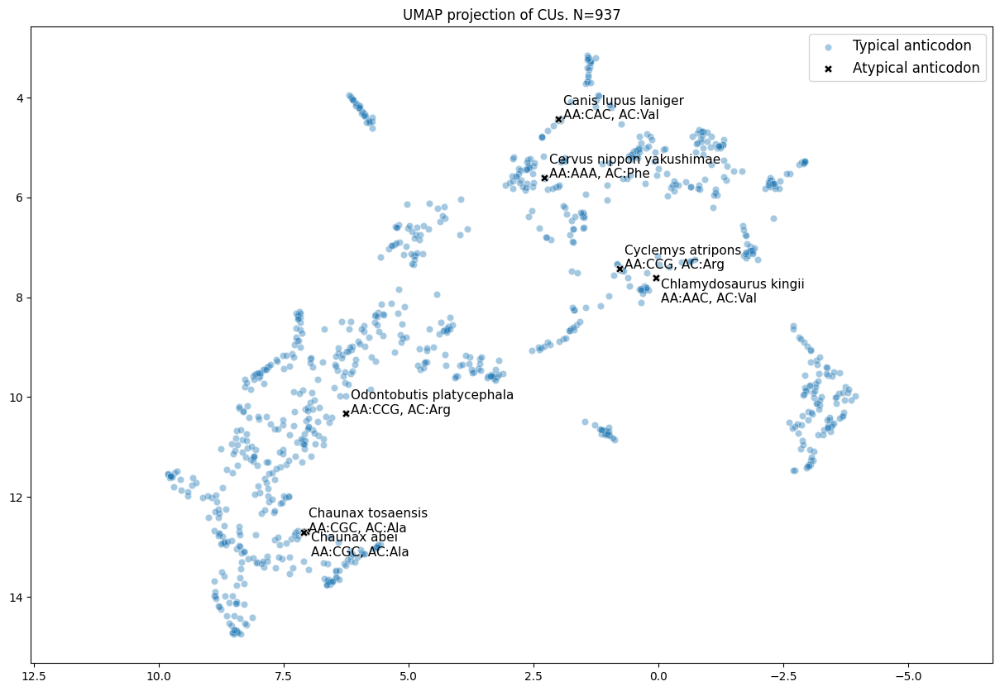

In [323]:
plt.figure(figsize=(15, 10), facecolor='white')
sns.scatterplot(
    x=embedding.iloc[:, 0], y=embedding.iloc[:, 1], 
    alpha = 0.4, marker='o', label='Typical anticodon')
outliers_indices = ratio_umap_df.loc[ratio_umap_df.index.isin(atypical_ac_species_dict)].index
p1 = sns.scatterplot(
    x=embedding.iloc[:, 0][outliers_indices],
    y=embedding.iloc[:, 1][outliers_indices],
    marker='X', c='k', s=50,
    label='Atypical anticodon')
for outliers in outliers_indices:
    label = f'{outliers.replace('_', ' ')}\nAA:{atypical_ac_species_dict[outliers][0]}, AC:{atypical_ac_species_dict[outliers][1].replace('T','U')}'
    if ratio_umap_df.loc[outliers].name in ['Chaunax_abei', 'Chlamydosaurus_kingii']:
        p1.text(embedding.iloc[:, 0][outliers]-0.1, embedding.iloc[:, 1][outliers]+0.5, label, fontsize=11)
    else:
        p1.text(embedding.iloc[:, 0][outliers]-0.1, embedding.iloc[:, 1][outliers]+0.0, label, fontsize=11)
plt.gca().set_aspect('equal', 'datalim')
plt.gca().invert_yaxis()
plt.gca().invert_xaxis()
plt.title(f'UMAP projection of CUs. N={len(ratio_umap_df)}')
plt.legend(loc='upper right', fontsize=12)
plt.xlabel('')
plt.ylabel('')
plt.show()

### ratio_df_tax

In [13]:
taxonomy_depth = 20
taxonomy_cols = [f'Taxonomy_{i}' for i in range(1, taxonomy_depth+1)]
taxonomy_df = pd.DataFrame(None, columns=taxonomy_cols)
taxonomy_df[taxonomy_df.columns] = CU_13.groupby('Species').first().Taxonomy.str.split('_', expand=True)
taxonomy_df

,Taxonomy_1,Taxonomy_2,Taxonomy_3,Taxonomy_4,Taxonomy_5,Taxonomy_6,Taxonomy_7,Taxonomy_8,Taxonomy_9,Taxonomy_10,Taxonomy_11,Taxonomy_12,Taxonomy_13,Taxonomy_14,Taxonomy_15,Taxonomy_16,Taxonomy_17,Taxonomy_18,Taxonomy_19,Taxonomy_20
Species,,,,,,,,,,,,,,,,,,,,
Abalistes_stellaris,Eukaryota,Metazoa,Chordata,Craniata,Vertebrata,Euteleostomi,Actinopterygii,Neopterygii,Teleostei,Neoteleostei,Acanthomorphata,Eupercaria,Tetraodontiformes,Balistidae,Abalistes,None,None,None,None,None
Abbottina_obtusirostris,Eukaryota,Metazoa,Chordata,Craniata,Vertebrata,Euteleostomi,Actinopterygii,Neopterygii,Teleostei,Ostariophysi,Cypriniformes,Cyprinidae,Abbottina,None,None,None,None,None,None,None
Abbottina_rivularis,Eukaryota,Metazoa,Chordata,Craniata,Vertebrata,Euteleostomi,Actinopterygii,Neopterygii,Teleostei,Ostariophysi,Cypriniformes,Cyprinidae,Abbottina,None,None,None,None,None,None,None
Ablennes_hians,Eukaryota,Metazoa,Chordata,Craniata,Vertebrata,Euteleostomi,Actinopterygii,Neopterygii,Teleostei,Neoteleostei,Acanthomorphata,Ovalentaria,Atherinomorphae,Beloniformes,Belonidae,Ablennes,None,None,None,None
Abramis_brama,Eukaryota,Metazoa,Chordata,Craniata,Vertebrata,Euteleostomi,Actinopterygii,Neopterygii,Teleostei,Ostariophysi,Cypriniformes,Cyprinidae,Abramis,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zosterops_lateralis,Eukaryota,Metazoa,Chordata,Craniata,Vertebrata,Euteleostomi,Archelosauria,Archosauria,Dinosauria,Saurischia,Theropoda,Coelurosauria,Aves,Neognathae,Passeriformes,Zosteropidae,Zosterops,None,None,None
Zu_cristatus,Eukaryota,Metazoa,Chordata,Craniata,Vertebrata,Euteleostomi,Actinopterygii,Neopterygii,Teleostei,Neoteleostei,Acanthomorphata,Lampriformes,Trachipteridae,Zu,None,None,None,None,None,None
diploid_Megalobrama_amblycephala_x_Xenocypris_davidi,Eukaryota,Metazoa,Chordata,Craniata,Vertebrata,Euteleostomi,Actinopterygii,Neopterygii,Teleostei,Ostariophysi,Cypriniformes,Cyprinidae,Cyprinidaehybridsp,None,None,None,None,None,None,None


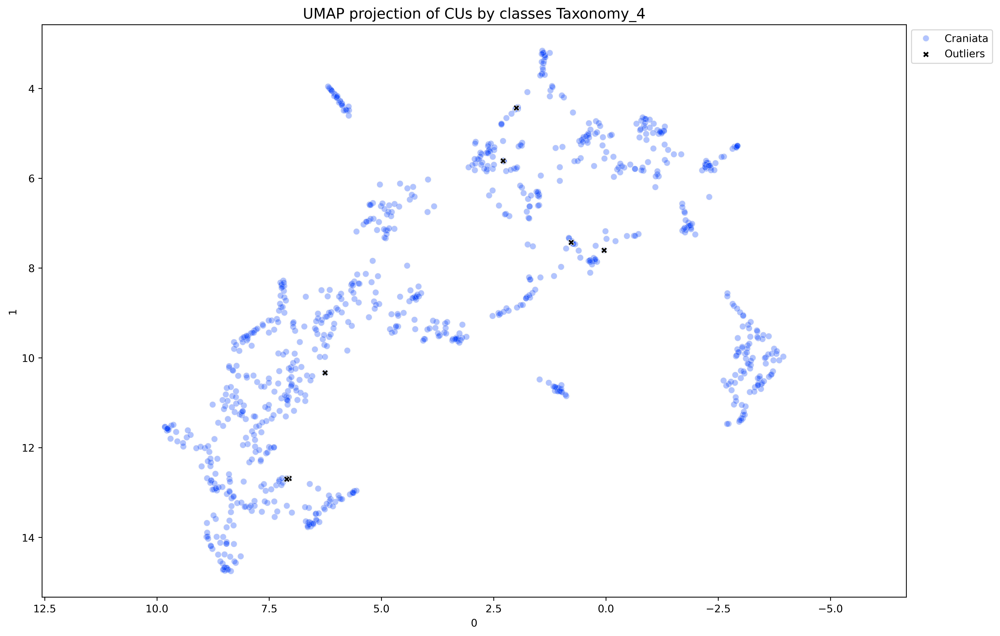

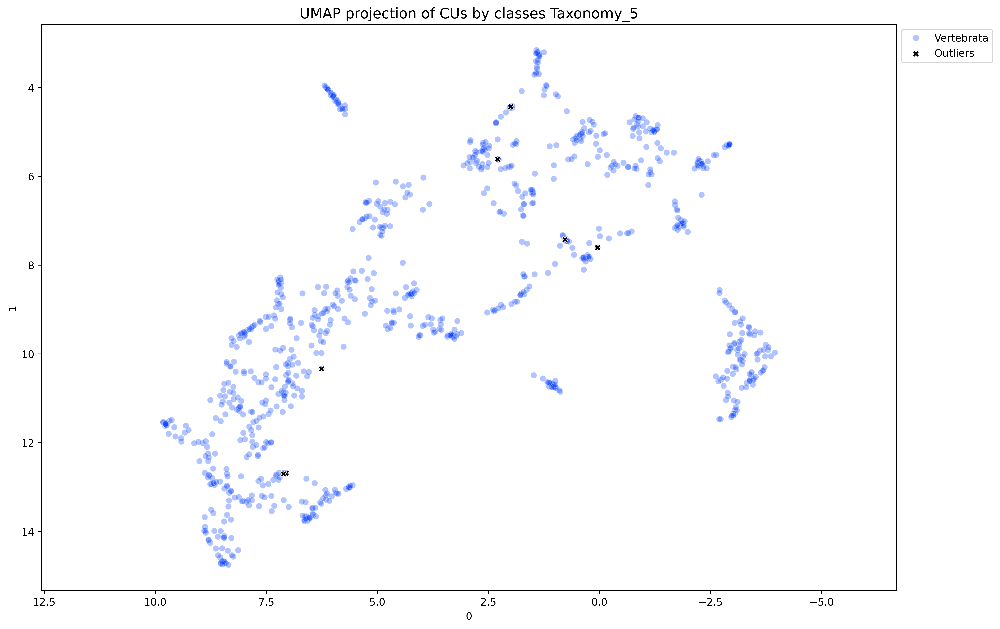

KeyboardInterrupt: 

In [325]:
for tax_idx in taxonomy_df.iloc[:, 3:8]:
    fig, ax = plt.subplots(figsize=(15, 10), dpi=600)
    sns.scatterplot(x=embedding.iloc[:, 0],
                    y=embedding.iloc[:, 1],
                    alpha=0.3,
                    hue=taxonomy_df[tax_idx],
                    palette=sns.color_palette('bright6', 
                        n_colors=len(
                            taxonomy_df.loc[:, tax_idx].unique())))
    sns.scatterplot(x=embedding.iloc[:, 0][atypical_ac_species_dict.keys()],
                    y=embedding.iloc[:, 1][atypical_ac_species_dict.keys()],
                    marker='X', color='black', label='Outliers')
    plt.gca().invert_yaxis()
    plt.gca().invert_xaxis()
    plt.gca().set_aspect('equal', 'datalim')
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    plt.title(f'UMAP projection of CUs by classes {tax_idx}', fontsize=14)
    plt.show()

### Outlayers' fam

In [14]:
AAU_12 = pd.DataFrame({aa: CU_12[codons].sum(axis=1)
                       for aa, codons in aa_dict_full.items()})

outlier_family_dict = {}
for outlier in atypical_ac_species_dict:
    domein = -1
    if outlier == 'Chlamydosaurus_kingii':
        domein = -2
    outlier_family = taxonomy_df.loc[outlier].loc[taxonomy_df.loc[outlier].notna()].iloc[domein]
    outlier_family_dict[outlier] = taxonomy_df.loc[(taxonomy_df==outlier_family).any(axis=1)].index.to_list()
outlier_family_dict

{'Canis_lupus_laniger': ['Canis_anthus',
  'Canis_latrans',
  'Canis_lupus',
  'Canis_lupus_familiaris',
  'Canis_lupus_laniger',
  'Canis_lupus_lupus'],
 'Cervus_nippon_yakushimae': ['Cervus_canadensis_songaricus',
  'Cervus_elaphus',
  'Cervus_elaphus_xanthopygus',
  'Cervus_elaphus_yarkandensis',
  'Cervus_nippon_centralis',
  'Cervus_nippon_hortulorum',
  'Cervus_nippon_kopschi',
  'Cervus_nippon_sichuanicus',
  'Cervus_nippon_taiouanus',
  'Cervus_nippon_yakushimae',
  'Cervus_nippon_yesoensis'],
 'Chaunax_abei': ['Chaunax_abei', 'Chaunax_pictus', 'Chaunax_tosaensis'],
 'Chaunax_tosaensis': ['Chaunax_abei', 'Chaunax_pictus', 'Chaunax_tosaensis'],
 'Chlamydosaurus_kingii': ['Chlamydosaurus_kingii', 'Pogona_vitticeps'],
 'Cyclemys_atripons': ['Cyclemys_atripons',
  'Cyclemys_fusca',
  'Cyclemys_oldhami',
  'Cyclemys_pulchristriata',
  'Cyclemys_tcheponensis'],
 'Odontobutis_platycephala': ['Odontobutis_interrupta',
  'Odontobutis_platycephala',
  'Odontobutis_potamophila',
  'Odonto

In [16]:
AAU_fracion

Species
Odontobutis_interrupta      0.019050
Odontobutis_platycephala    0.019034
Odontobutis_potamophila     0.020143
Odontobutis_sinensis        0.019045
Odontobutis_yaluensis       0.019310
dtype: float64

0.0451
0.0453


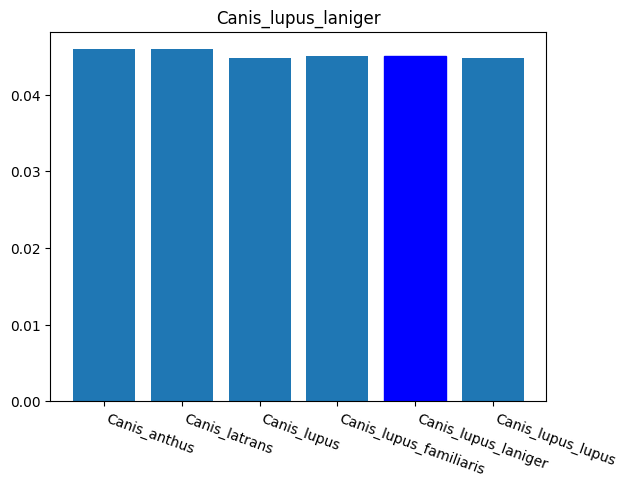

0.0658
0.0662


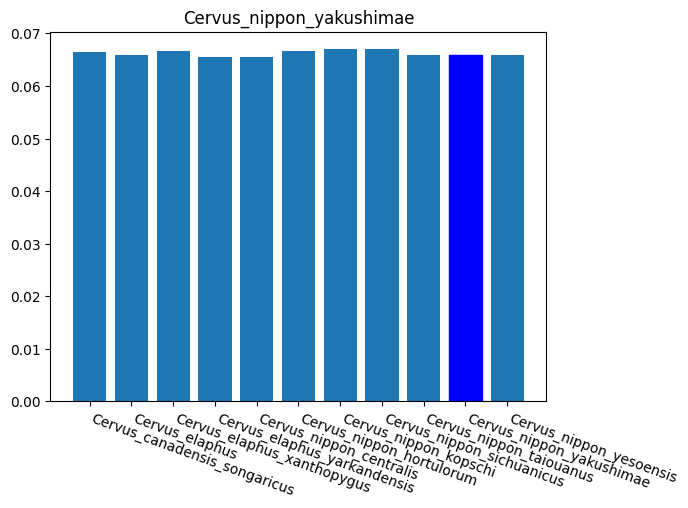

0.0874
0.0886


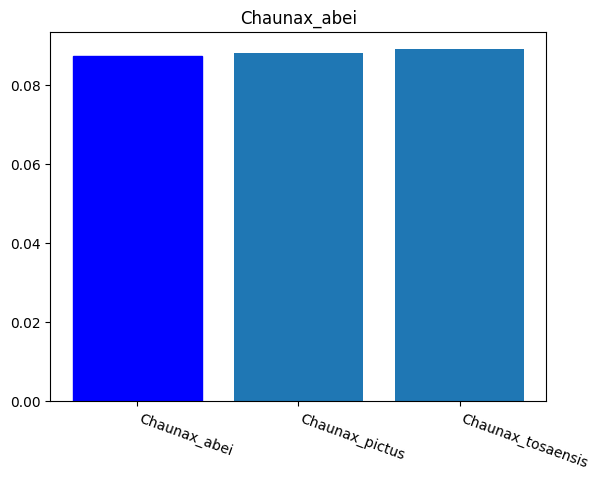

0.089
0.0878


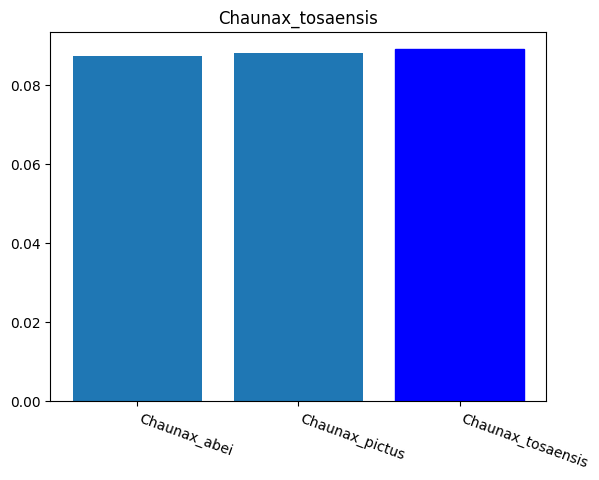

0.0298
0.034


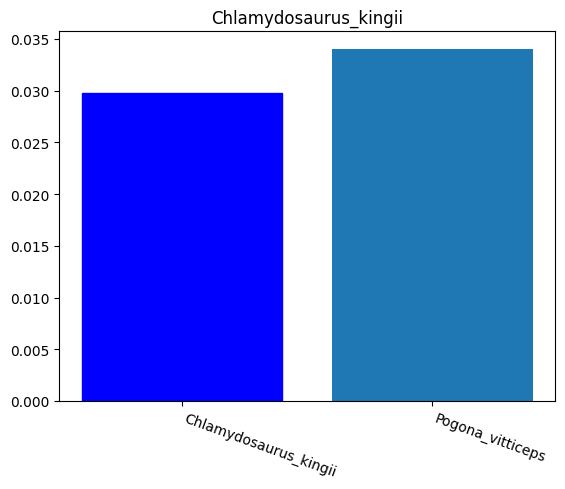

0.0183
0.0186


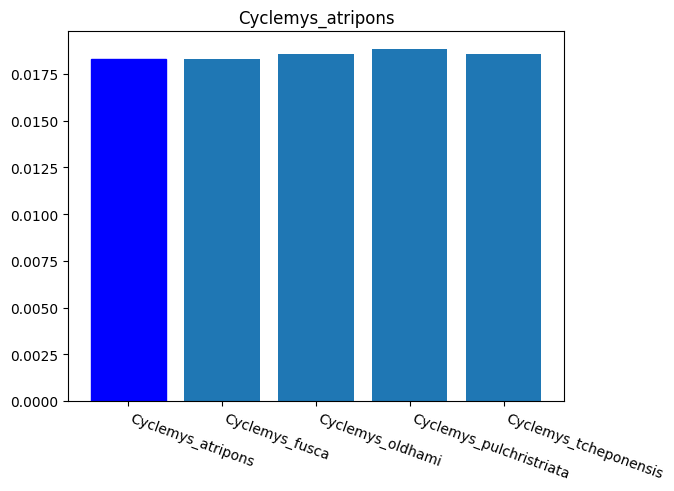

0.019
0.0194


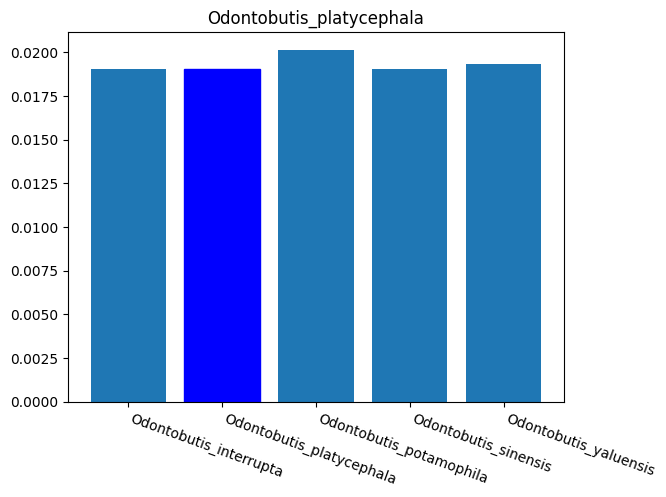

In [21]:
for outlier in atypical_ac_species_dict:
    # if outlier == 'Chaunax_tosaensis':
    #     continue
    aa = atypical_ac_species_dict[outlier][1]
    AAU_fracion = AAU_12.loc[outlier_family_dict[outlier], aa] / AAU_12.loc[outlier_family_dict[outlier]].sum(axis=1)
    print(AAU_fracion.loc[outlier].round(4))
    print(AAU_fracion.loc[AAU_fracion.index != outlier].mean().round(4))
    barlist = plt.bar(outlier_family_dict[outlier], AAU_fracion)
    barlist[outlier_family_dict[outlier].index(outlier)].set_color('b')
    plt.xticks(rotation=-20, ha='left')
    plt.title(outlier)
    plt.show()

In [254]:
redundant_aa_dict = {'Halichoeres_tenuispinis': 'Gly', 'Mitsukurina_owstoni': 'Met', #  'Ciona_intestinalis': 'Gly', 
                     'Normichthys_operosus': 'Asp', 'Pseudalutarius_nasicornis': 'Phe'}

[0.06174200661521499, 0.05895316804407714, 0.060723157604195416, 0.05846662989520132, 0.061449435106089835, 0.06179310344827586, 0.0653793103448276, 0.06232763375620518, 0.06094870380584666, 0.06205184776613348, 0.06120760959470637, 0.0623104494072236, 0.06041379310344828, 0.061241379310344825, 0.060689655172413794, 0.06041379310344828]


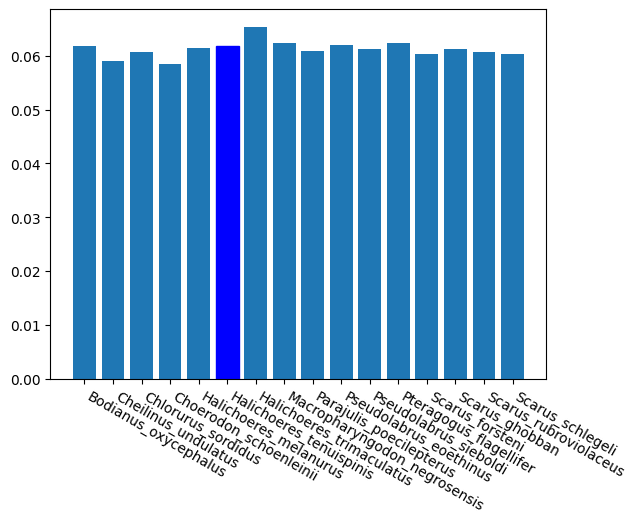

[0.045805739514348784, 0.04718543046357616, 0.04497792494481236, 0.04663355408388521, 0.04525386313465784, 0.04415011037527594, 0.04415011037527594, 0.045805739514348784, 0.04880066170388751, 0.04911699779249448, 0.04769782189137028]


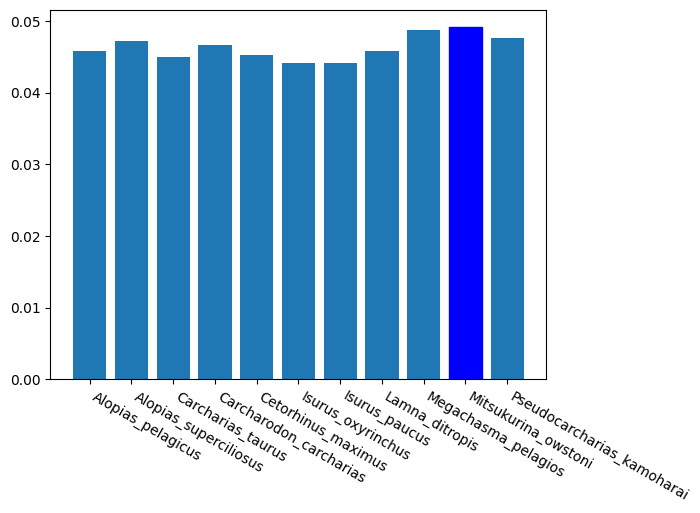

[0.019597019044990338, 0.01932633903920486, 0.02013237727523442, 0.019575406672180867]


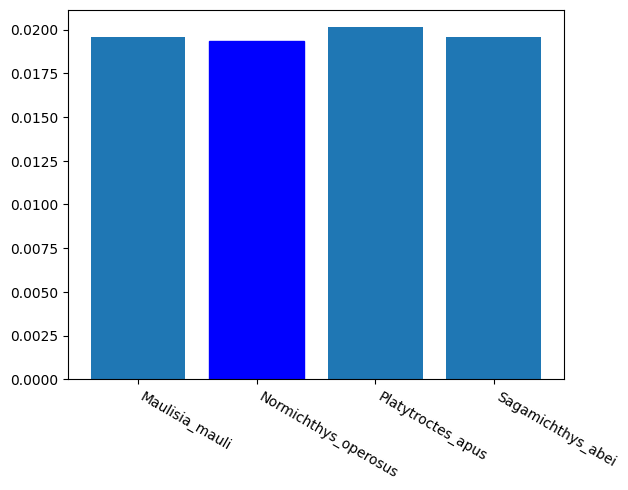

[0.060005505092210296, 0.05956977385548814, 0.05874241588527303, 0.05929398786541644, 0.05956977385548814, 0.06205184776613348, 0.060397131825703256, 0.05929398786541644, 0.059845559845559844, 0.05973025048169557, 0.05956977385548814, 0.05973025048169557, 0.058774834437086095, 0.06067291781577496, 0.059845559845559844, 0.06015452538631347, 0.0576710816777042, 0.059845559845559844, 0.058823529411764705, 0.059179741260666115, 0.06177606177606178, 0.06012134583563155, 0.06012134583563155, 0.060397131825703256]


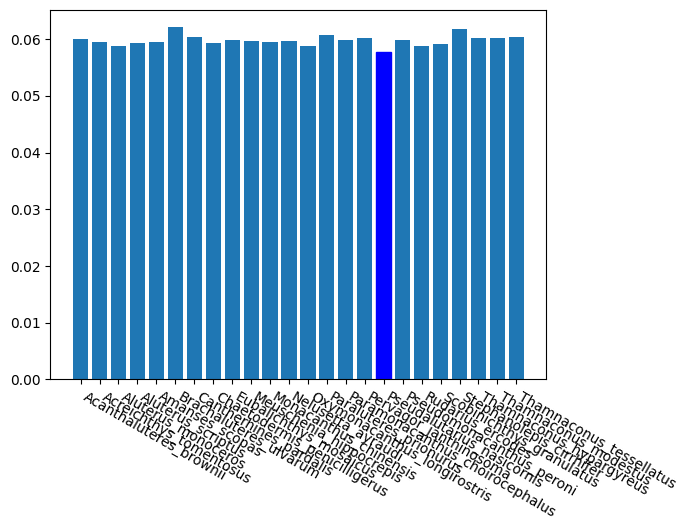

In [330]:
outlier_family_red_dict = {}
for outlier in redundant_species:
    domein = -2
    if outlier in ['Ciona_intestinalis', 'Mitsukurina_owstoni']:
        domein = -3
    if outlier in taxonomy_df.index:
        outlier_family = taxonomy_df.loc[outlier].loc[taxonomy_df.loc[outlier].notna()].iloc[domein]
        outlier_family_red_dict[outlier] = taxonomy_df.loc[(taxonomy_df==outlier_family).any(axis=1)].index.to_list()
        aa = redundant_aa_dict[outlier]
        AAU_fracion = AAU_12.loc[outlier_family_red_dict[outlier], aa] / AAU_12.loc[outlier_family_red_dict[outlier]].sum(axis=1)
        print(AAU_fracion.tolist())
        barlist = plt.bar(outlier_family_red_dict[outlier], AAU_fracion)
        barlist[outlier_family_red_dict[outlier].index(outlier)].set_color('b')
        plt.xticks(rotation=-30, ha='left')
        plt.show()

## Cognate check

In [369]:
table_t= table[['Species']+[f'{codon}_12' for codon in CODONS]+[f'{Ac}_Ac' for Ac in aa_s if Ac != 'Xaa']]
no_lys_ac = table_t.loc[table_t.isna().any(axis=1)].Species.tolist()
# table[table.Species.isin(no_lys_ac)]
table_t.loc[table_t.isna().any(axis=1)]
table_t.loc[table_t.Species=='Caenolestes_fuliginosus', 'Lys_Ac'].values[0] is pd.NA

True

In [ ]:
# NOT COGNATE but cheking if most common codon is complementary to anticodon
aa_s = sorted(list(aa_dict.keys()))
codons_12 = [f'{codon}_12' for codon in CODONS]
cognates = []
table_t= table[['Species']+[f'{codon}_12' for codon in CODONS]+[f'{Ac}_Ac' for Ac in aa_s if Ac != 'Xaa']]
table_t = table_t.dropna()
for species in tqdm(table_t.Species):
    breaker = False
    cognates_sp = [species]
    for aa in aa_s[:-1]:
        ac = table_t.loc[table_t.Species==species, f'{aa}_Ac'].values[0]
        ac = str(Seq(ac).reverse_complement())  # Нужно перевернуть Ac, чтобы соответсвовал CU
        if species not in exp_family_dic['Ciona_intestinalis']:
            aa_fam_table = table_t.loc[table_t.Species==species, [c+'_12' for c in aa_dict[aa]]]
        else:
            aa_fam_table = table_t.loc[table_t.Species==species, [c+'_12' for c in Ciona_aa_dict[aa]]]
        codon_max = aa_fam_table.values.max()
        if f'{ac}_12' not in aa_fam_table.columns:
            # breaker = True
            # break
            cognates_sp.append(0)
            continue
        codon_cogn = aa_fam_table.loc[:,f'{ac}_12'].values[0]
        if codon_max <= codon_cogn:
            cognates_sp.append(1)
        else: 
            cognates_sp.append(0)
    if breaker == True:
        continue
    cognates.append(cognates_sp)
cognate_df = pd.DataFrame(data=cognates, columns=['Species']+[f'{aa}_cognate' for aa in aa_s[:-1]]) 

In [297]:
# DONT NEEDED TO MATRIX DERIVING
aa_s = sorted(list(aa_dict.keys()))
codons_12 = [f'{codon}_12' for codon in CODONS]
cognates = []
cognate_cols = []
table_t= table[['Species']+[f'{codon}_12' for codon in CODONS]+[f'{Ac}_Ac' for Ac in aa_s if Ac != 'Xaa']]
# table_t = table_t.dropna()
for species in tqdm(table_t.Species):
    breaker = False
    cognates_sp = [species]
    for aa in aa_s[:-1]:
        ac = table_t.loc[table_t.Species==species, f'{aa}_Ac'].values[0]
        if ac is pd.NA:     # Учитывает сумчатых, у которых нет тРНК лизина
            for codon in aa_dict[aa]:
                cognates_sp.append(0)
            continue
        ac = str(Seq(ac).reverse_complement())  # Нужно перевернуть Ac, чтобы соответсвовал CU
        # if species not in exp_family_dic['Ciona_intestinalis']:
        #     aa_fam_table = table_t.loc[table_t.Species==species, [c+'_12' for c in aa_dict[aa]]]
        # else:
        #     aa_fam_table = table_t.loc[table_t.Species==species, [c+'_12' for c in Ciona_aa_dict[aa]]]

        for codon in aa_dict[aa]:
            if codon not in cognate_cols:
                cognate_cols.append(codon)
            if codon == ac:
                cognates_sp.append(1)
            else: 
                cognates_sp.append(0)
        if breaker == True:
            break
    if breaker == True:
        continue

    cognates.append(cognates_sp)
cognate_df = pd.DataFrame(data=cognates, columns=['Species']+cognate_cols) 

  0%|          | 0/1025 [00:00<?, ?it/s]

In [300]:
cognate_df

,Species,GCT,GCC,GCA,GCG,CGT,CGC,CGA,CGG,AAT,...,ACA,ACG,TGA,TGG,TAT,TAC,GTT,GTC,GTA,GTG
0,Abalistes_stellaris,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
1,Ablennes_hians,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
2,Abronia_graminea,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
3,Abudefduf_vaigiensis,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
4,Acanthaluteres_brownii,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1020,Zaglossus_bruijni,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
1021,Zalophus_californianus,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
1022,Zanclus_cornutus,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
1023,Zebrasoma_flavescens,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0


In [4]:
# cognate_df.to_csv('Cognate.csv', index=False)
cognate_df = pd.read_csv('Cognate.csv').copy()
cognate_df

,Species,GCT,GCC,GCA,GCG,CGT,CGC,CGA,CGG,AAT,...,ACA,ACG,TGA,TGG,TAT,TAC,GTT,GTC,GTA,GTG
0,Abalistes_stellaris,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
1,Ablennes_hians,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
2,Abronia_graminea,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
3,Abudefduf_vaigiensis,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
4,Acanthaluteres_brownii,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1020,Zaglossus_bruijni,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
1021,Zalophus_californianus,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
1022,Zanclus_cornutus,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
1023,Zebrasoma_flavescens,0,0,1,0,0,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0


## Amino acid usage

NameError: name 'CU_class' is not defined

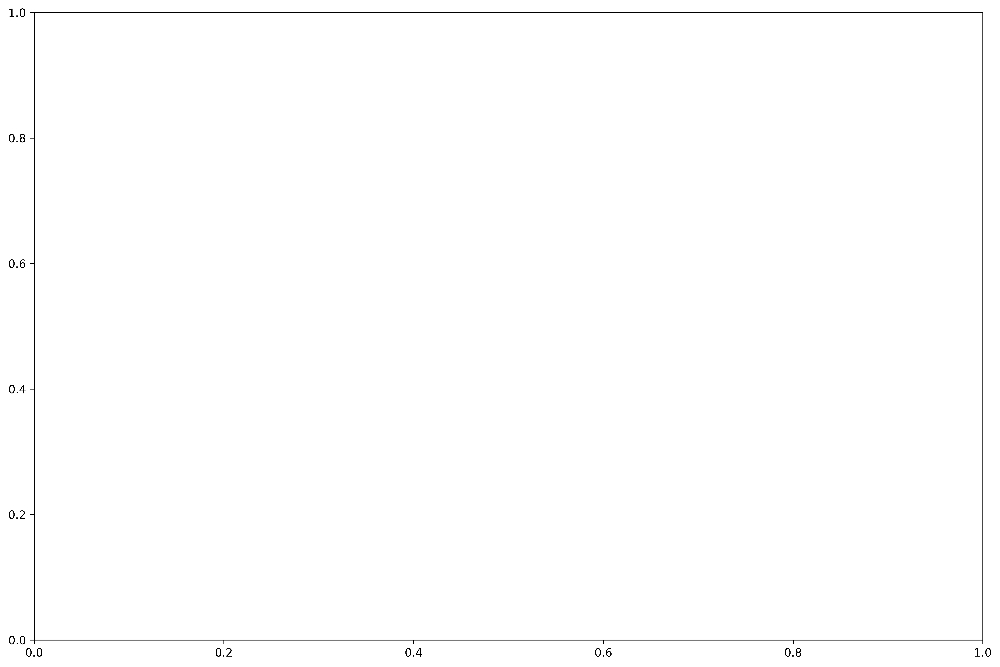

In [32]:
for n in [5, 15, 30, 100]:
    embedding = umap.UMAP(n_neighbors=n).fit_transform(ratio_umap_df.drop('Species', axis=1))
    fig, ax = plt.subplots(figsize=(15, 10), dpi=600)
    sns.scatterplot(x=embedding[:, 0],
        y=embedding[:, 1],
        alpha=0.3,
        hue=CU_class['Class'])   
    sns.scatterplot(x=embedding[:, 0][CU_12_fraction.loc[CU_12_fraction.Species.isin(atypical_ac_species_dict)].index.values],
        y=embedding[:, 1][CU_12_fraction.loc[CU_12_fraction.Species.isin(atypical_ac_species_dict)].index.values],
        marker='X', color='black', label='Exception')
    plt.gca().set_aspect('equal', 'datalim')
    plt.title(f'UMAP projection of CUs with n_neighbors={n} by classes', fontsize=14)
    plt.show()

## Correlations

In [107]:
cu_cols = tablee.loc[:,'AAA_12':'TTT_12'].columns.to_list()
ac_cols = tablee.loc[:,'Ala_Ac':'Val_Ac'].columns.to_list()
aau_cols = tablee.loc[:,'Ala':'Xaa'].columns.to_list()
ge_cols = tablee.loc[:,'Ala_Ge':'Val_Ge'].columns.to_list()

In [153]:
corrs = tablee.loc[:,['Species'] + cu_cols+ge_cols+aau_cols]
corrs.loc[:,cu_cols] = corrs.loc[:,cu_cols].div(corrs.loc[:,cu_cols].sum(axis=1), axis=0)
corrs.loc[:,aau_cols] = corrs.loc[:,aau_cols].div(corrs.loc[:,aau_cols].sum(axis=1), axis=0)

corrs = corrs.drop('Species', axis='columns').corr(method='spearman')
corrs

,AAA_12,AAC_12,AAG_12,AAT_12,ACA_12,ACC_12,ACG_12,ACT_12,AGA_12,AGC_12,...,Met,Phe,Pro,Ser1,Ser2,Thr,Trp,Tyr,Val,Xaa
AAA_12,1.000000,0.525947,-0.527621,0.296263,0.704826,-0.233300,-0.459771,0.148472,-0.013060,-0.322943,...,0.775445,-0.141071,-0.507859,0.605429,-0.286305,0.423117,-0.645168,0.517579,-0.700604,0.000113
AAC_12,0.525947,1.000000,-0.246652,-0.472058,0.477863,0.395973,-0.205897,-0.311320,-0.045715,0.231284,...,0.296988,-0.418849,0.011327,0.335462,-0.110632,0.639806,-0.452929,0.207769,-0.551623,-0.060893
AAG_12,-0.527621,-0.246652,1.000000,-0.014883,-0.415786,0.002266,0.571078,0.110038,-0.021380,0.108366,...,-0.181969,0.063323,0.038504,-0.127033,0.282399,-0.234579,0.074132,-0.110713,0.337382,0.041278
AAT_12,0.296263,-0.472058,-0.014883,1.000000,0.156203,-0.729588,-0.094165,0.562956,0.028309,-0.651075,...,0.533886,0.396893,-0.677219,0.282385,-0.171521,-0.278164,-0.253625,0.440871,-0.103853,0.065903
ACA_12,0.704826,0.477863,-0.415786,0.156203,1.000000,-0.181437,-0.380560,-0.105992,-0.026002,-0.196765,...,0.671066,-0.325700,-0.351216,0.247139,-0.282879,0.584869,-0.429415,0.356444,-0.548593,-0.004580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Thr,0.423117,0.639806,-0.234579,-0.278164,0.584869,0.487887,-0.222294,-0.083724,-0.053288,0.158684,...,0.282560,-0.571469,0.066577,0.187939,-0.066401,1.000000,-0.407065,0.088115,-0.640789,-0.017692
Trp,-0.645168,-0.452929,0.074132,-0.253625,-0.429415,0.070495,0.211866,-0.305587,-0.011733,0.189016,...,-0.622834,0.108841,0.419575,-0.757609,0.035158,-0.407065,1.000000,-0.391365,0.749250,-0.109880
Tyr,0.517579,0.207769,-0.110713,0.440871,0.356444,-0.394871,-0.056658,0.216024,-0.097345,-0.341273,...,0.634480,0.084142,-0.617876,0.322531,-0.149016,0.088115,-0.391365,1.000000,-0.259879,-0.279661
Val,-0.700604,-0.551623,0.337382,-0.103853,-0.548593,-0.162369,0.480865,-0.239570,-0.013178,0.146778,...,-0.536445,0.270752,0.206789,-0.702184,0.153761,-0.640789,0.749250,-0.259879,1.000000,-0.008619


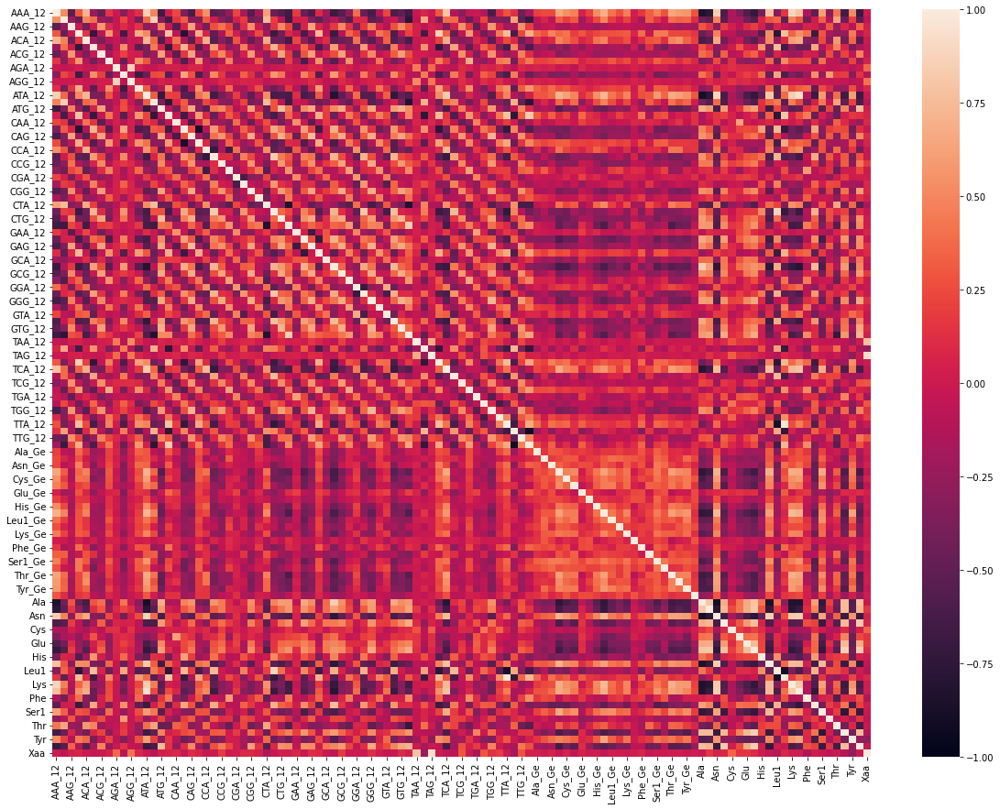

In [165]:
fig, ax = plt.subplots(figsize=(20, 15))
sns.heatmap(corrs, vmin=-1)
plt.savefig('HM.jpg', bbox_inches='tight')
plt.show()

In [160]:
import plotly.express as px
fig = px.imshow(corrs, x=corrs.columns, y=corrs.index, width=900,height=900, color_continuous_scale=px.colors.sequential.Hot)
# fig.update_layout()
fig.show()

In [147]:
corrs_5 = corrs[(corrs.abs() > 0.7).sum(axis=1) > 5]
corrs_5

,AAA_12,AAC_12,AAG_12,AAT_12,ACA_12,ACC_12,ACG_12,ACT_12,AGA_12,AGC_12,...,Met,Phe,Pro,Ser1,Ser2,Thr,Trp,Tyr,Val,Xaa
AAA_12,1.000000,0.520857,-0.547539,0.302067,0.701167,-0.240804,-0.470962,0.155086,-0.020136,-0.337438,...,0.775592,-0.132060,-0.506632,0.606530,-0.294356,0.408148,-0.620406,0.530211,-0.670748,-0.011381
AAT_12,0.302067,-0.468886,-0.015711,1.000000,0.162003,-0.716053,-0.093246,0.564677,0.025817,-0.634646,...,0.534205,0.388360,-0.660075,0.279104,-0.174613,-0.284044,-0.234627,0.436977,-0.089470,0.062322
ACC_12,-0.240804,0.394208,0.014291,-0.716053,-0.182577,1.000000,0.000282,-0.393730,-0.056639,0.536587,...,-0.454249,-0.425295,0.654672,-0.136631,0.162298,0.495178,0.096160,-0.373970,-0.130552,-0.039982
ATA_12,0.857246,0.355181,-0.334569,0.508611,0.724936,-0.375301,-0.386651,0.289902,-0.038702,-0.459837,...,0.940395,-0.109892,-0.671441,0.594104,-0.286252,0.371830,-0.656724,0.606508,-0.672625,-0.006690
ATC_12,0.488742,0.844317,-0.193270,-0.416456,0.354288,0.438195,-0.216913,-0.180849,-0.052840,0.221280,...,0.236917,-0.398931,0.041085,0.443674,-0.024643,0.625208,-0.469104,0.224001,-0.574536,-0.104318
ATT_12,0.030768,-0.608312,-0.014333,0.783072,0.000789,-0.681336,-0.035875,0.426669,0.027078,-0.511101,...,0.252119,0.437800,-0.443991,0.051859,-0.137591,-0.457534,0.043315,0.161949,0.146236,0.053653
CAC_12,-0.364467,0.316498,0.076470,-0.785610,-0.172284,0.713262,0.176146,-0.540159,-0.010195,0.649149,...,-0.528067,-0.353780,0.655226,-0.319782,0.222318,0.257960,0.262305,-0.421103,0.155753,-0.027705
CCC_12,-0.522294,0.015634,0.294530,-0.490004,-0.525954,0.600213,0.259065,-0.305583,-0.013570,0.531084,...,-0.645971,-0.002794,0.682000,-0.345495,0.353087,-0.031731,0.336041,-0.346137,0.299203,-0.015513
CTC_12,-0.439946,0.191924,0.168462,-0.653753,-0.428659,0.720973,0.123161,-0.320607,-0.019085,0.582917,...,-0.684958,-0.062594,0.711934,-0.217426,0.307399,0.125255,0.242490,-0.414126,0.115624,-0.029291
GCC_12,-0.670438,-0.090007,0.206177,-0.649855,-0.502897,0.613288,0.284195,-0.512079,-0.041145,0.618534,...,-0.783522,-0.101435,0.774188,-0.573420,0.290534,-0.106595,0.621099,-0.535385,0.524238,-0.062836


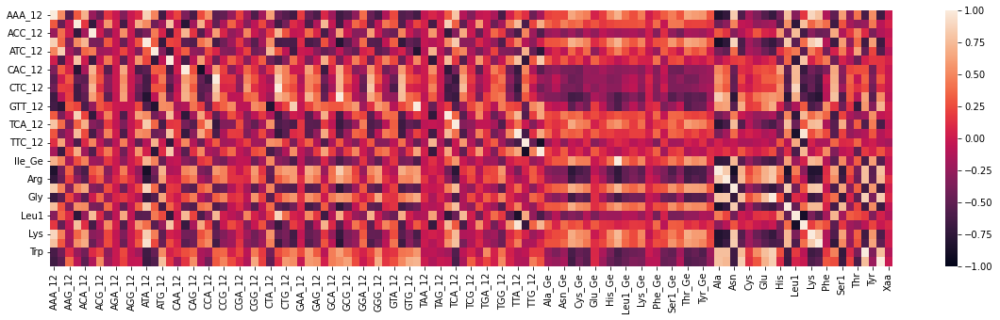

In [148]:
fig, ax = plt.subplots(figsize=(20, 5))
sns.heatmap(corrs_5, vmin=-1)
plt.show()

In [116]:
corrs.loc['AAA_12'','TAG_12':'TTT_12']

TAG_12   -0.020794
TAT_12    0.307617
TCA_12    0.794991
TCC_12   -0.114261
TCG_12   -0.338819
TCT_12   -0.044548
TGA_12   -0.012302
TGC_12   -0.160344
TGG_12   -0.624121
TGT_12    0.043014
TTA_12    0.282156
TTC_12    0.128869
TTG_12   -0.440750
TTT_12   -0.174098
Name: AAA_12, dtype: float64

In [98]:
# write Gibbs energy into the table 
with open(r'C:\Users\Эльдар\Downloads\out.fst', 'r') as handle:
    trna_parsed_list = list(SeqIO.parse(handle, "fasta"))


trna_dic_gib = {}
for i in range(len(trna_parsed_list)):
    description = trna_parsed_list[i].id.split('|')
    species = description[1]
    aa = description[-2]

    seq = str(trna_parsed_list[i].seq)
    seq_gib = [s for s in seq if s.isdigit()]
    gib = float(seq[seq.find(seq_gib[0])-1 : seq.find(seq_gib[-1])+1])

    if species not in trna_dic_gib:
        trna_dic_gib[species] = {}
    trna_dic_gib[species][aa] = gib
    
for species in trna_dic_gib:
    if species in tablee.Species.values:
        for aa in trna_dic_gib[species]:
            tablee.loc[tablee.Species==species, f'{aa}_Ge'] = trna_dic_gib[species][aa]

In [105]:
tablee = tablee.convert_dtypes()
tablee.to_csv('Tablee.csv', index=False)
tablee.to_csv(r'C:/Work/Lab/pr-29-trna-or-mutagenesis/raw/MutSpec_CU_tRNA.csv', sep='\t', index=False)

## Density plot

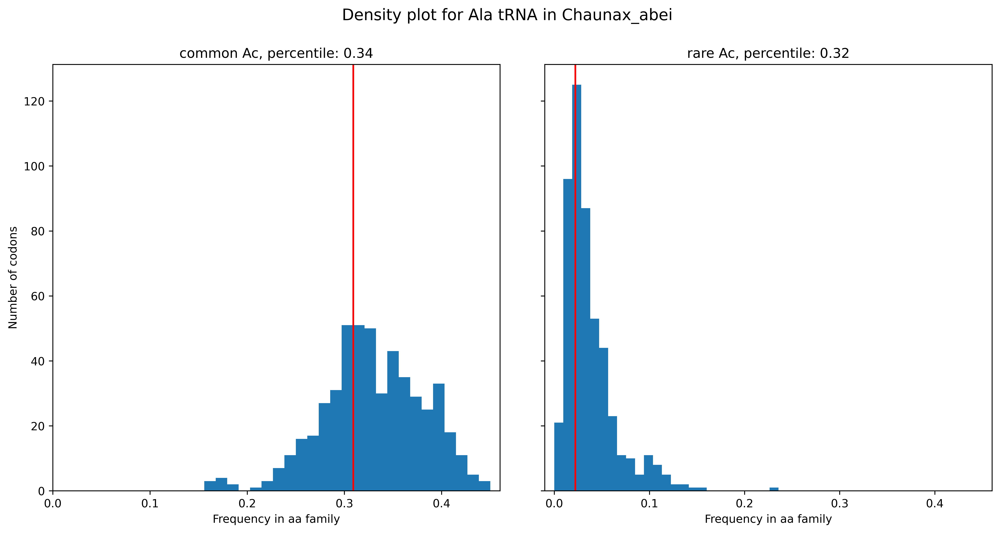

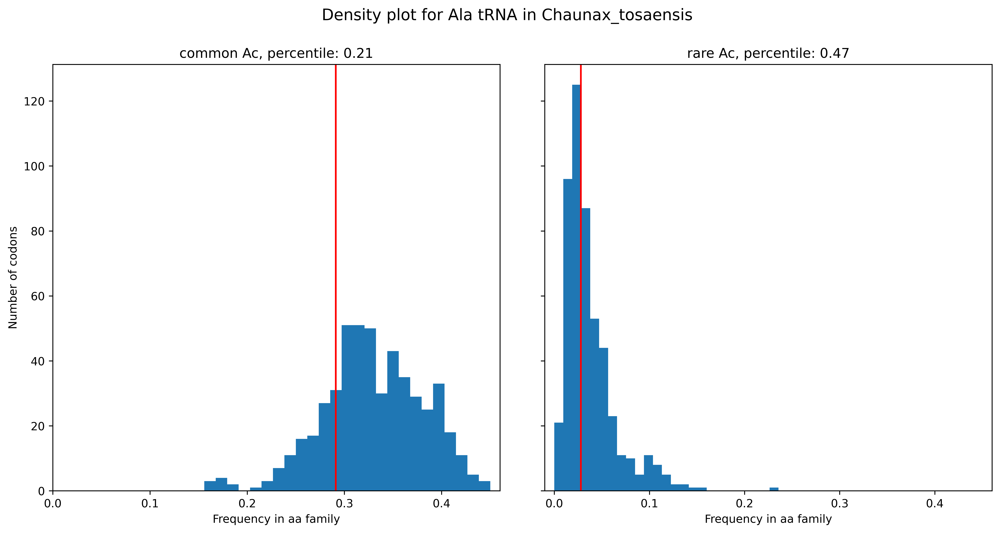

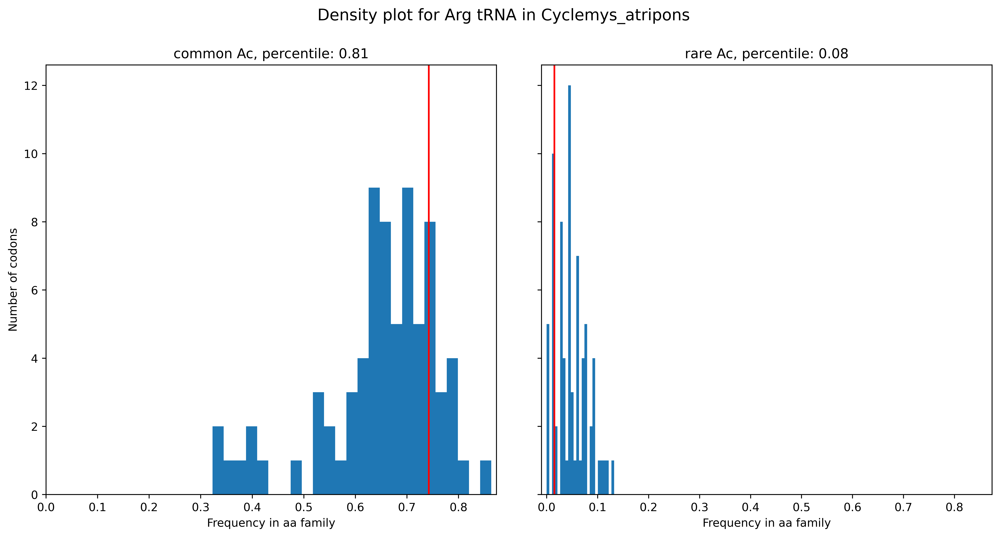

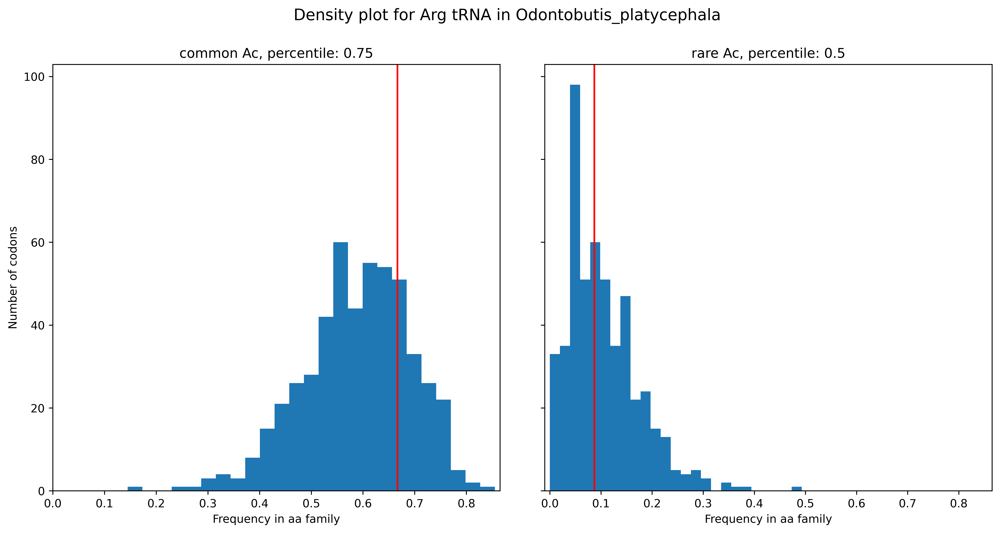

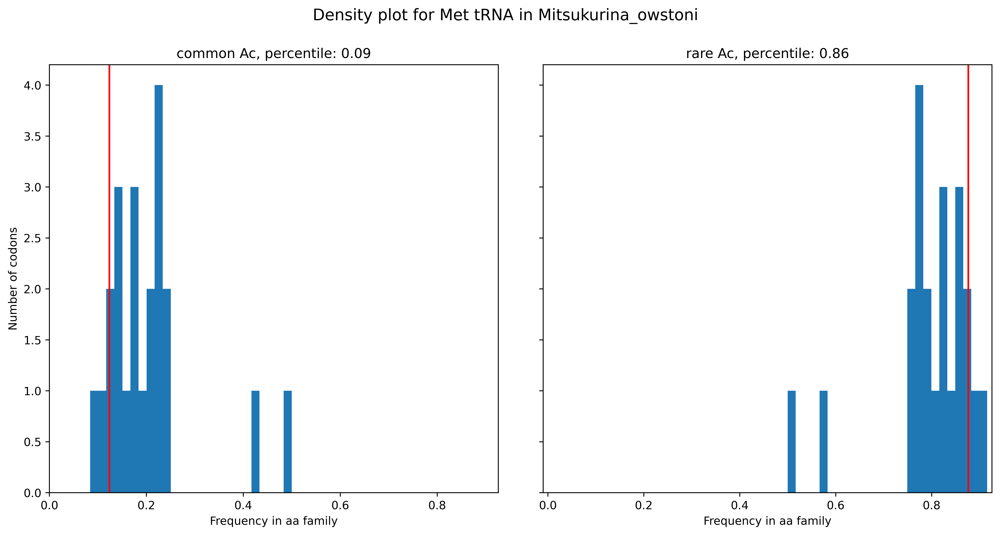

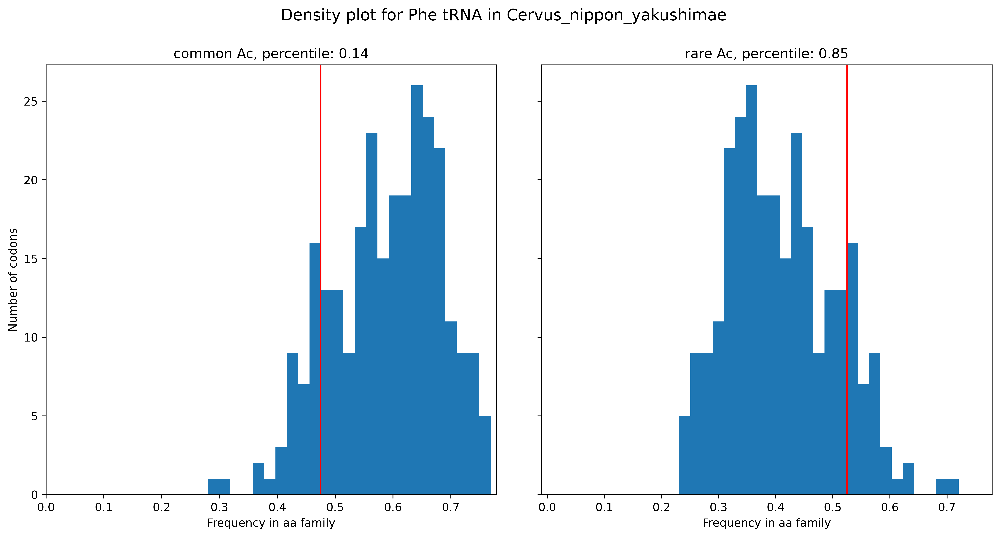

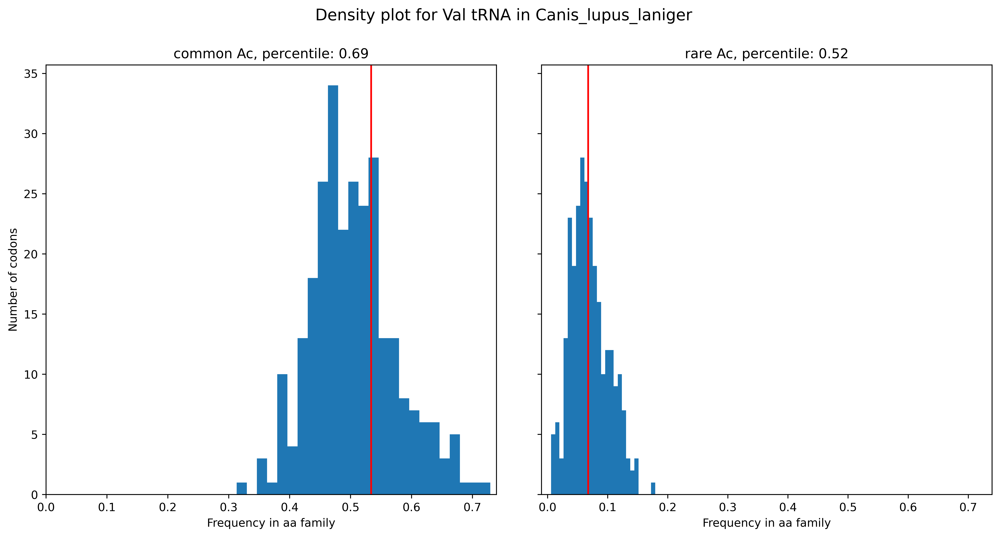

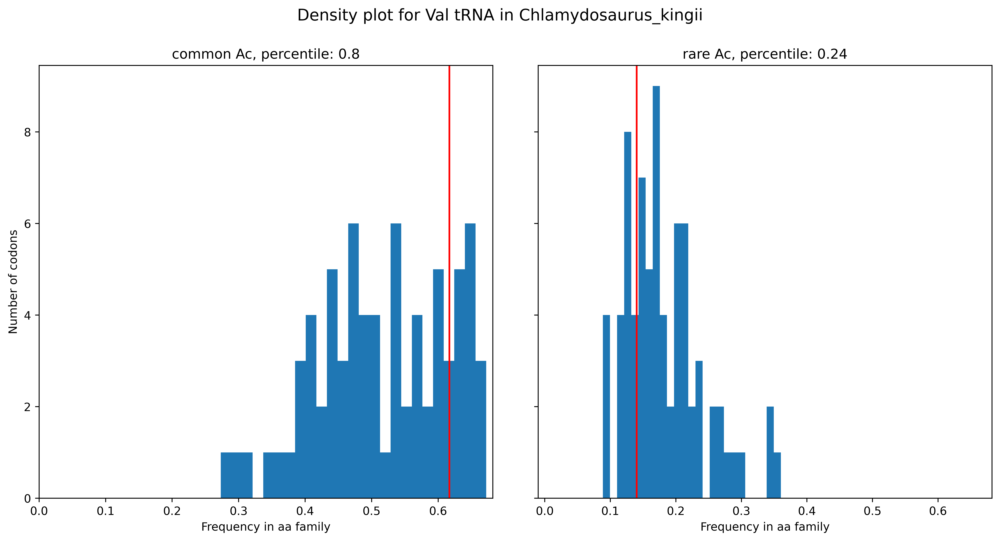

In [416]:
# super_exp = {}
for species in atypical_ac_species_dict:
    if species == 'Ciona_intestinalis' or species in super_exp: 
        continue

    aa = atypical_ac_species_dict[species][0][:-3]
    ac = atypical_ac_species_dict[species][1]
    ac = str(Seq(ac).reverse_complement())
    rare_ac = ac
    common_ac = str(Seq(cognate_acs[f'{aa}_Ac']).reverse_complement())

    
    # if rare_ac not in aa_dict[aa]: 
    #     super_exp[species] = [rare_ac, aa]

    common_freqs = []
    rare_freqs = []
    relative_class = table.loc[table.Species==species, 'Class'].values[0]
    relative_table = table.loc[table.Class==relative_class]  # [table.Species.isin(exp_family_dic[species])]

    for relative in relative_table.Species:
        codon_aa_number = relative_table.loc[relative_table.Species==relative, aa].values[0]

        rare_codon_number = relative_table.loc[relative_table.Species==relative, f'{rare_ac}_12'].values[0]
        rare_codon_freq = rare_codon_number / codon_aa_number
        if relative == species:
            rare_exp_freq = rare_codon_freq
        rare_freqs.append(rare_codon_freq)

        common_codon_number = relative_table.loc[relative_table.Species==relative, f'{common_ac}_12'].values[0]
        common_codon_freq = common_codon_number / codon_aa_number
        if relative == species:
            common_exp_freq = common_codon_freq
        common_freqs.append(common_codon_freq)

    rare_percentile = round(sorted(rare_freqs).index(rare_exp_freq) / len(rare_freqs), 2)
    common_percentile = round(sorted(common_freqs).index(common_exp_freq) / len(common_freqs), 2)


    fig, ax = plt.subplots(1,2, figsize=(15,7), sharey=True, dpi=600)
    ax = ax.ravel()
    bin_divider=6
    xlim = max(common_freqs+rare_freqs) + 0.01
    ax[0].hist(common_freqs, bins=25)
    ax[0].set_xlabel('Frequency in aa family')
    ax[0].set_ylabel('Number of codons')
    ax[0].set_title(f'common Ac, percentile: {common_percentile}')
    ax[0].axvline(x=common_exp_freq, c='r')
    ax[0].set_xlim([0,xlim])

    ax[1].hist(rare_freqs, bins=25) # 
    ax[1].set_xlabel('Frequency in aa family')
    # ax[1].set_ylabel('Number of codons')
    ax[1].set_title(f'rare Ac, percentile: {rare_percentile}')
    ax[1].axvline(x=rare_exp_freq, c='r')
    ax[1].set_xlim([-0.01, xlim])
    fig.suptitle(f'Density plot for {aa} tRNA in {species}', fontsize=14)
    fig.subplots_adjust(wspace=0.1)
    fig.patch.set_facecolor('white')
    plt.show()
    # print(f'AA: {aa},\trare_ac: {rare_ac},\t common_ac: {common_ac} \tin {species}\t{aa_dict[aa]}')
# print(super_exp)

In [21]:
# species which have Ac out of its AA codon fam
super_exp = {'Phocoena_phocoena': ['TGA', 'Arg'],    # 'Cervus_elaphus': ['CAA', 'Arg'] has normal Ac
 'Physeter_catodon': ['TCG', 'Cys'],                # 'Pteropus_scapulatus': ['GCA', 'Ser1'] as well
 'Platanista_minor': ['TCG', 'Cys'],
 'Cuon_alpinus': ['GAT', 'Glu'],
 'Rusa_unicolor_swinhoei': ['CCC', 'His']}
table.loc[:,'Species':'Species'].join(table.loc[table.Species.isin(super_exp), 'Ala_Ac':'Val_Ac'], how='right')

,Species,Ala_Ac,Arg_Ac,Asn_Ac,Asp_Ac,Cys_Ac,Gln_Ac,Glu_Ac,Gly_Ac,His_Ac,...,Lys_Ac,Met_Ac,Phe_Ac,Pro_Ac,Ser1_Ac,Ser2_Ac,Thr_Ac,Trp_Ac,Tyr_Ac,Val_Ac
274,Cuon_alpinus,TGC,TCG,GTT,GTC,GCA,TTG,ATC,TCC,GTG,...,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
756,Phocoena_phocoena,TGC,TCA,GTT,GTC,GCA,TTG,TTC,TCC,GTG,...,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
760,Physeter_catodon,TGC,TCG,GTT,GTC,CGA,TTG,TTC,TCC,GTG,...,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
766,Platanista_minor,TGC,TCG,GTT,GTC,CGA,TTG,TTC,TCC,GTG,...,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
857,Rusa_unicolor_swinhoei,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GGG,...,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC


## GLM

### Deriving the matrix

In [21]:
ceph = ['Asymmetron_lucayanum', 'Ciona_intestinalis', 'Epigonichthys_maldivensis', 'Asymmetron_inferum']
MS[MS.Species.isin(ceph)]

,Species,A_T,A_G,A_C,T_A,T_G,T_C,G_A,G_T,G_C,C_A,C_T,C_G
73,Asymmetron_lucayanum,0.006793,0.100179,0.011014,0.017491,0.006192,0.097882,0.555716,0.011556,0.041340,0.037114,0.112095,0.002628
325,Epigonichthys_maldivensis,0.008801,0.155012,0.018293,0.006421,0.000000,0.175807,0.118449,0.010900,0.010978,0.023743,0.432212,0.039385


In [22]:
substitutions = ['A>T', 'A>G', 'A>C', 'T>A', 'T>G', 'T>C', 'G>A', 'G>T', 'G>C', 'C>A', 'C>T', 'C>G']
matrix_cols = ['Species', 'Codon', 'CodonUsage', 'TrnaGe', 'AAUsage', 'DummyCognate', 'DummyMutSpecMatch'] + substitutions    # , 'DummyInlineWithMS'
# matrix = {col:[] for col in matrix_cols}
matrix_list = []
for species in tqdm(table.Species):
    if species in ceph:
        continue
    species_table = table[table.Species==species]
    # cognate_sp = cognate_df.loc[cognate_df.Species==species]
#     if species_table.loc[:, substitutions[0]].values[0] is pd.notna:
    ms_sp = list(species_table.loc[:,substitutions].values[0])
    for codon in CODONS:
        matrix_list_c = [species, codon]        
        aa = codon_aa_dict[codon]
        if aa == 'Xaa':
            continue
        variables = [f'{codon}_12', f'{aa}_Ge',  aa]
        values_by_variables = list(species_table.loc[:,variables].values[0])
        matrix_list_c += values_by_variables # add 'CodonUsage', 'TrnaGe', 'AAUsage'
        
        ac = table.loc[table.Species==species, f'{aa}_Ac'].values[0]
        if ac is not pd.NA:
            ac = str(Seq(ac).reverse_complement())  # Нужно перевернуть Ac, чтобы соответсвовал CU
            dum_cognate = 1 if codon == ac else 0       # dum_cognate = cognate_sp.loc[:,f'{aa}_cognate'].values[0]
        else:
            dum_cognate = 0
        matrix_list_c.append(dum_cognate)

        dum_ms_match = 1 if codon[2] in ['A', 'C'] else 0
        matrix_list_c.append(dum_ms_match)

        matrix_list_c += ms_sp
        matrix_list.append(matrix_list_c)

  0%|          | 0/1025 [00:00<?, ?it/s]

In [24]:
the_matrix = pd.DataFrame(data=matrix_list, columns=matrix_cols).convert_dtypes()
the_matrix = the_matrix.loc[~the_matrix.Species.isin(unverified_outliers)]

class_list = []
for species in tqdm(the_matrix.Species.unique()):
    row_number = 60
    cl = table.loc[table.Species==species, 'Class'].values[0]
    class_list += [cl for i in range(row_number)]
the_matrix['Class'] = class_list
cols = the_matrix.columns.tolist()
the_matrix = the_matrix.loc[:,cols[:2]+cols[-1:]+cols[2:-1]]

the_matrix = the_matrix.dropna(subset='TrnaGe')

the_matrix.loc[:,'TrnaGe'] = the_matrix.loc[:,'TrnaGe'] * -1
the_matrix = the_matrix.loc[~the_matrix.Species.isin(ceph)] #  Выброс по Gibbs energy

  0%|          | 0/1013 [00:00<?, ?it/s]

In [25]:
matrix_with_ms = the_matrix.drop(columns='DummyMutSpecMatch').dropna(subset=substitutions)
matrix_no_ms = the_matrix.drop(columns=substitutions)
matrix_no_ms

,Species,Codon,Class,CodonUsage,TrnaGe,AAUsage,DummyCognate,DummyMutSpecMatch
0,Abalistes_stellaris,AAA,Actinopterygii,64,21.5,71,1,1
1,Abalistes_stellaris,AAC,Actinopterygii,81,19.6,120,1,1
2,Abalistes_stellaris,AAG,Actinopterygii,7,21.5,71,0,0
3,Abalistes_stellaris,AAT,Actinopterygii,39,19.6,120,0,0
4,Abalistes_stellaris,ACA,Actinopterygii,124,26.6,307,1,1
...,...,...,...,...,...,...,...,...
61255,Zeus_faber,TGT,Actinopterygii,9,16.1,23,0,0
61256,Zeus_faber,TTA,Actinopterygii,143,20.0,156,1,1
61257,Zeus_faber,TTC,Actinopterygii,75,10.0,217,1,1
61258,Zeus_faber,TTG,Actinopterygii,13,20.0,156,0,0


In [88]:
matrix_with_ms

,Species,Codon,Class,CodonUsage,TrnaGe,AAUsage,DummyCognate,A>T,A>G,A>C,T>A,T>G,T>C,G>A,G>T,G>C,C>A,C>T,C>G
180,Abudefduf_vaigiensis,AAA,Actinopterygii,77,19.1,77,1,0.0,0.063498,0.021166,0.010499,0.010499,0.283484,0.424866,0.030348,0.060695,0.012659,0.082285,0.0
181,Abudefduf_vaigiensis,AAC,Actinopterygii,85,22.1,117,1,0.0,0.063498,0.021166,0.010499,0.010499,0.283484,0.424866,0.030348,0.060695,0.012659,0.082285,0.0
182,Abudefduf_vaigiensis,AAG,Actinopterygii,0,19.1,77,0,0.0,0.063498,0.021166,0.010499,0.010499,0.283484,0.424866,0.030348,0.060695,0.012659,0.082285,0.0
183,Abudefduf_vaigiensis,AAT,Actinopterygii,32,22.1,117,0,0.0,0.063498,0.021166,0.010499,0.010499,0.283484,0.424866,0.030348,0.060695,0.012659,0.082285,0.0
184,Abudefduf_vaigiensis,ACA,Actinopterygii,106,20.0,295,1,0.0,0.063498,0.021166,0.010499,0.010499,0.283484,0.424866,0.030348,0.060695,0.012659,0.082285,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61255,Zeus_faber,TGT,Actinopterygii,9,16.1,23,0,0.011301,0.090411,0.067808,0.0,0.035788,0.107363,0.252069,0.084023,0.084023,0.076347,0.190867,0.0
61256,Zeus_faber,TTA,Actinopterygii,143,20.0,156,1,0.011301,0.090411,0.067808,0.0,0.035788,0.107363,0.252069,0.084023,0.084023,0.076347,0.190867,0.0
61257,Zeus_faber,TTC,Actinopterygii,75,10.0,217,1,0.011301,0.090411,0.067808,0.0,0.035788,0.107363,0.252069,0.084023,0.084023,0.076347,0.190867,0.0
61258,Zeus_faber,TTG,Actinopterygii,13,20.0,156,0,0.011301,0.090411,0.067808,0.0,0.035788,0.107363,0.252069,0.084023,0.084023,0.076347,0.190867,0.0


In [26]:
def data_converter(matrix): # for some reason numeric df doesn't convert into numeric array
    for col in matrix.loc[:,'CodonUsage':].columns:
        matrix[col] = np.array(matrix[col], dtype=float)

data_converter(matrix_with_ms)
data_converter(matrix_no_ms)

### Modeling

In [11]:
def glm(matrix, mode):
    glm_list = []

    glm_cols = [None, 'Const', 'Const_pv']
    for var in matrix.columns[4:]:
        glm_cols.append(var)
        glm_cols.append(f'{var}_pv')
        
    if mode == 'Species':
        glm_cols[0] = 'Species'
    else: 
        glm_cols[0] = 'Codon'

    for observation in matrix[mode].unique():
        glm_list_sp = [observation]
        matrix_sp = matrix.loc[matrix[mode]==observation]

        endog = matrix_sp.CodonUsage
        exog = sm.add_constant(matrix_sp.loc[:,'TrnaGe':])
        model = sm.GLM(endog, exog, family=sm.families.Poisson()).fit()
        parameters = model.params
        pvals = model.pvalues

        if len(parameters)*2 == len(glm_cols)-1:           # add nan value if a constant didn't appear 
            for param, pval in zip(parameters, pvals): # to matching values and number of columns
                glm_list_sp.append(param)           
                glm_list_sp.append(pval)
        else:
            glm_list_sp.append(np.nan)
            glm_list_sp.append(np.nan)
            for param, pval in zip(parameters, pvals):
                glm_list_sp.append(param)
                glm_list_sp.append(pval)

        glm_list.append(glm_list_sp)
    
    glm_df = pd.DataFrame(data=glm_list, columns=glm_cols)
    return glm_df

def result_stats(glm_result, name=None, excel=False):
    coeffs = glm_result.loc[:, 'Const'::2].describe()
    pvals = glm_result.iloc[:, 2::2].describe()
    if excel == True:
        coeffs.drop('count', axis=0).to_excel(f'GLM_Results/{name}.xlsx')
        pvals.drop('count', axis=0).to_excel(f'GLM_Results/{name}_pv.xlsx')
    print(coeffs)
    print(pvals)  # np.log(glm_dms_sp.iloc[:, 2::2])


In [27]:
glm_dms_sp = glm(matrix_no_ms, 'Species')
glm_ms_sp =  glm(matrix_with_ms, 'Species')
glm_dms_c = glm(matrix_no_ms, 'Codon')
glm_ms_c =  glm(matrix_with_ms, 'Codon')

In [17]:
mode = 'Species'
# glm_dms_sp.to_csv(f'C:\Work\Lab\pr-29-trna-or-mutagenesis\derived\GLM_{mode}_DummyMS.csv', index=False)

result_stats(glm_dms_sp) # , name='glm_dms_sp', excel=True
# (glm_dms_sp.DummyMutSpecMatch_pv < 0.01).sum() / 1021

             Const       TrnaGe      AAUsage  DummyCognate  DummyMutSpecMatch
count  1017.000000  1017.000000  1017.000000   1017.000000        1017.000000
mean      2.739577     0.006783     0.003579      0.229317           0.810273
std       0.401805     0.018306     0.014256      0.192035           0.341121
min      -1.676263    -0.068690     0.002234     -0.352856          -0.944406
25%       2.510267    -0.004203     0.002810      0.104142           0.589063
50%       2.768029     0.007366     0.003044      0.234233           0.802843
75%       2.982092     0.017900     0.003300      0.363963           1.018555
max       3.922566     0.082260     0.457163      0.767381           1.945932
            Const_pv     TrnaGe_pv     AAUsage_pv  DummyCognate_pv  \
count   1.017000e+03  1.017000e+03   1.017000e+03     1.017000e+03   
mean    2.105160e-06  1.631960e-01   8.544895e-09     6.931279e-02   
std     6.713447e-05  2.697332e-01   2.725004e-07     1.882087e-01   
min     0.000000e+

In [354]:
matrix_no_ms.loc[matrix_no_ms.Species=='Mus_musculus']
matrix_no_ms.loc[matrix_no_ms.Codon=='ATG']

,Species,Codon,Class,CodonUsage,TrnaGe,AAUsage,DummyCognate,DummyMutSpecMatch
12,Abalistes_stellaris,ATG,Actinopterygii,43.0,-10.0,149.0,1.0,0.0
72,Ablennes_hians,ATG,Actinopterygii,29.0,-12.6,152.0,1.0,0.0
132,Abronia_graminea,ATG,Reptilia,29.0,-12.7,216.0,1.0,0.0
192,Abudefduf_vaigiensis,ATG,Actinopterygii,56.0,-11.7,158.0,1.0,0.0
252,Acanthaluteres_brownii,ATG,Actinopterygii,104.0,-13.2,154.0,1.0,0.0
...,...,...,...,...,...,...,...,...
61212,Zaglossus_bruijni,ATG,Mammalia,46.0,-14.9,194.0,1.0,0.0
61272,Zalophus_californianus,ATG,Mammalia,48.0,-12.3,245.0,1.0,0.0
61332,Zanclus_cornutus,ATG,Actinopterygii,73.0,-17.7,141.0,1.0,0.0
61392,Zebrasoma_flavescens,ATG,Actinopterygii,52.0,-13.5,148.0,1.0,0.0


In [106]:
# glm_ms_sp.to_csv(f'C:\Work\Lab\pr-29-trna-or-mutagenesis\derived\GLM_{mode}_RealMS.csv', index=False)

result_stats(glm_ms_sp) # , name='glm_ms_sp', excel=True
# glm_ms_sp

       Const      TrnaGe     AAUsage  DummyCognate         A>T         A>G   
count    0.0  279.000000  279.000000    279.000000  279.000000  279.000000  \
mean     NaN    0.006637    0.003353      0.756345    0.076146    0.469598   
std      NaN    0.015542    0.000317      0.220792    0.139239    0.590978   
min      NaN   -0.033583    0.002748     -0.115527    0.000000    0.000000   
25%      NaN   -0.002567    0.003128      0.585327    0.000000    0.127673   
50%      NaN    0.006851    0.003348      0.776390    0.033482    0.275442   
75%      NaN    0.015648    0.003515      0.920374    0.071787    0.542879   
max      NaN    0.072067    0.005115      1.286284    1.271132    4.358108   

              A>C         T>A         T>G         T>C         G>A         G>T   
count  279.000000  279.000000  279.000000  279.000000  279.000000  279.000000  \
mean     0.085571    0.217876    0.079809    1.323950    4.332555    0.222315   
std      0.156842    0.296200    0.246651    0.923864 

In [410]:
mode = 'Codon'
glm_dms_c.to_csv(f'C:\Work\Lab\pr-29-trna-or-mutagenesis\derived\GLM_{mode}_DummyMS.csv', index=False)
result_stats(glm_dms_c)

           Const     TrnaGe    AAUsage  DummyCognate  DummyMutSpecMatch
count  30.000000  60.000000  60.000000     60.000000          60.000000
mean    1.712962  -0.002908   0.009417      0.789650           0.878033
std     1.866633   0.020278   0.012297      3.209101           3.109602
min    -3.674865  -0.059035  -0.011796     -0.419945         -20.229965
25%     0.470445  -0.016452   0.001913      0.000000           0.000000
50%     2.120209  -0.001767   0.006973      0.000000           0.000000
75%     2.845585   0.010287   0.013498      0.057877           2.477134
max     4.295101   0.039029   0.072030     24.388175           4.238972
            Const_pv      TrnaGe_pv     AAUsage_pv  DummyCognate_pv   
count   3.000000e+01   6.000000e+01   6.000000e+01        28.000000  \
mean    1.433946e-03   5.868400e-02   3.005642e-02         0.308026   
std     4.549095e-03   1.947662e-01   1.525778e-01         0.373154   
min     0.000000e+00  1.011339e-305   0.000000e+00         0.000000 

In [384]:
glm_ms_c.to_csv(f'C:\Work\Lab\pr-29-trna-or-mutagenesis\derived\GLM_{mode}_RealMS.csv', index=False)
# glm_ms_c = pd.read_csv('C:\Work\Lab\pr-29-trna-or-mutagenesis\derived\GLM_RealMS.csv').copy()
print(glm_ms_c.loc[:, 'Const'::2].describe())
glm_ms_c.iloc[:, 2::2].mean()

           Const     TrnaGe    AAUsage  DummyCognate        A>T        A>G   
count  40.000000  60.000000  60.000000  6.000000e+01  60.000000  60.000000  \
mean    2.192791  -0.001860   0.009088  1.012847e+00  -0.096344   0.824704   
std     1.142149   0.012282   0.008957  1.489475e+00   3.166213   2.032680   
min    -1.037688  -0.040544  -0.001834 -1.417898e-14 -10.301977  -2.523987   
25%     1.599073  -0.012076   0.003438 -6.935129e-16  -1.818865  -0.664214   
50%     2.170668   0.000929   0.005815  1.990487e-15   0.312280   0.211900   
75%     3.106436   0.004932   0.012656  2.747403e+00   2.001195   1.723591   
max     4.229148   0.021273   0.044123  4.255561e+00   5.720173   5.624673   

             A>C        T>A        T>G        T>C        G>A        G>T   
count  60.000000  60.000000  60.000000  60.000000  60.000000  60.000000  \
mean    1.363075   0.397948  -0.475432   0.080213   0.050987   0.168864   
std     2.557489   0.801609   2.459280   0.955734   0.523877   0.421404 

Const_pv           0.024831
TrnaGe_pv          0.153607
AAUsage_pv         0.009148
DummyCognate_pv    0.142532
A>T_pv             0.234038
A>G_pv             0.164388
A>C_pv             0.221089
T>A_pv             0.278153
T>G_pv             0.188433
T>C_pv             0.061315
G>A_pv             0.131974
G>T_pv             0.285428
G>C_pv             0.258683
C>A_pv             0.193333
C>T_pv             0.141017
C>G_pv             0.324680
dtype: float64

In [386]:
# glm by classes and codons
mode = 'Codon'
for cl in the_matrix.Class.unique()[:-1]:
    matrix_cl = matrix_no_ms.loc[matrix_no_ms.Class==cl]
    glm(matrix_cl, mode).to_csv(f'C:\Work\Lab\pr-29-trna-or-mutagenesis\derived\GLM_{mode}_DummyMS_{cl}.csv', index=False)
    matrix_cl = matrix_with_ms.loc[matrix_with_ms.Class==cl]
    glm(matrix_cl, mode).to_csv(f'C:\Work\Lab\pr-29-trna-or-mutagenesis\derived\GLM_{mode}_RealMS_{cl}.csv', index=False)

c:\Soft\Python\lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
c:\Soft\Python\lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
c:\Soft\Python\lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
c:\Soft\Python\lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
c:\Soft\Python\lib\site-pack

In [135]:
for cl in the_matrix.Class.unique()[:-1]:
    glm_dms_cl = pd.read_csv(f'C:\Work\Lab\pr-29-trna-or-mutagenesis\derived\GLM_DummyMS_{cl}.csv')
    glm_ms_cl = pd.read_csv(f'C:\Work\Lab\pr-29-trna-or-mutagenesis\derived\GLM_RealMS_{cl}.csv')
    print(cl)
    print('Dummy MS')
    print(glm_dms_cl.loc[:, 'Const'::2].mean())
    print(glm_dms_cl.iloc[:, 2::2].mean())
    print('\n')
    print('Real MS')
    print(glm_ms_cl.loc[:, 'Const'::2].mean())
    print(glm_ms_cl.iloc[:, 2::2].mean())
    print('\n')

Actinopterygii
Dummy MS
Const                2.115854
TrnaGe              -0.002451
AAUsage              0.007165
DummyCognate         0.705200
DummyMutSpecMatch    1.125754
dtype: float64
Const_pv                0.005261
TrnaGe_pv               0.099396
AAUsage_pv              0.059727
DummyCognate_pv         0.058507
DummyMutSpecMatch_pv    0.000087
dtype: float64


Real MS
Const           2.419343
TrnaGe         -0.002089
AAUsage         0.006921
DummyCognate    1.223692
A>T            -0.258642
A>G             0.836010
A>C             1.120539
T>A             0.649710
T>G            -0.672052
T>C             0.091292
G>A            -0.003362
G>T             0.571401
G>C             0.356209
C>A            -0.132151
C>T             0.159329
C>G             0.037661
dtype: float64
Const_pv           0.143165
TrnaGe_pv          0.221559
AAUsage_pv         0.096952
DummyCognate_pv    0.150963
A>T_pv             0.306090
A>G_pv             0.176236
A>C_pv             0.351268
T>A_pv    

#### No Dummies

In [ ]:
no_dummy_matrix

#### Scaled matrix

In [30]:
scaled_matrix = the_matrix.copy()
scaler = MinMaxScaler()    # StandardScaler() не работает
scaled_matrix[['CodonUsage', 'TrnaGe', 'AAUsage']] = scaler.fit_transform(scaled_matrix[['CodonUsage', 'TrnaGe', 'AAUsage']])
scaled_matrix

,Species,Codon,Class,CodonUsage,TrnaGe,AAUsage,DummyCognate,DummyMutSpecMatch,A>T,A>G,A>C,T>A,T>G,T>C,G>A,G>T,G>C,C>A,C>T,C>G
0,Abalistes_stellaris,AAA,Actinopterygii,0.160401,0.560472,0.086885,1,1,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
1,Abalistes_stellaris,AAC,Actinopterygii,0.203008,0.504425,0.167213,1,1,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
2,Abalistes_stellaris,AAG,Actinopterygii,0.017544,0.560472,0.086885,0,0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
3,Abalistes_stellaris,AAT,Actinopterygii,0.097744,0.504425,0.167213,0,0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
4,Abalistes_stellaris,ACA,Actinopterygii,0.310777,0.710914,0.473770,1,1,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61255,Zeus_faber,TGT,Actinopterygii,0.022556,0.401180,0.008197,0,0,0.011301,0.090411,0.067808,0.0,0.035788,0.107363,0.252069,0.084023,0.084023,0.076347,0.190867,0.0
61256,Zeus_faber,TTA,Actinopterygii,0.358396,0.516224,0.226230,1,1,0.011301,0.090411,0.067808,0.0,0.035788,0.107363,0.252069,0.084023,0.084023,0.076347,0.190867,0.0
61257,Zeus_faber,TTC,Actinopterygii,0.187970,0.221239,0.326230,1,1,0.011301,0.090411,0.067808,0.0,0.035788,0.107363,0.252069,0.084023,0.084023,0.076347,0.190867,0.0
61258,Zeus_faber,TTG,Actinopterygii,0.032581,0.516224,0.226230,0,0,0.011301,0.090411,0.067808,0.0,0.035788,0.107363,0.252069,0.084023,0.084023,0.076347,0.190867,0.0


In [33]:
scaled_matrix_dms = scaled_matrix.drop(columns=substitutions)
data_converter(scaled_matrix_dms)

scale_glm_ms_sp = glm(scaled_matrix_dms, 'Species')
result_stats(scale_glm_ms_sp)

             Const       TrnaGe      AAUsage  DummyCognate  DummyMutSpecMatch
count  1021.000000  1021.000000  1021.000000   1021.000000        1021.000000
mean     -3.169493     0.226377     1.892666      0.228948           0.814826
std       0.341673     0.621722     0.246417      0.191382           0.332503
min      -4.145132    -2.328585     1.362979     -0.352856          -0.944406
25%      -3.377297    -0.146042     1.714296      0.104792           0.595935
50%      -3.144599     0.243717     1.857233      0.233937           0.803289
75%      -2.954694     0.606379     2.012621      0.361709           1.018830
max      -2.056714     2.788626     3.216505      0.767381           1.945932
          Const_pv    TrnaGe_pv   AAUsage_pv  DummyCognate_pv   
count  1021.000000  1021.000000  1021.000000      1021.000000  \
mean      0.055991     0.879863     0.219341         0.773691   
std       0.046353     0.086309     0.044631         0.135027   
min       0.001744     0.568352     0.

#### Simplier MS

In [35]:
ms4 = ['G>A', 'T>C', 'C>T', 'A>G']
matrix_with_ms4 = matrix_with_ms.loc[:,matrix_with_ms.columns[:7].tolist() + ms4]
data_converter(matrix_with_ms4)
# glm_ms4_c = glm(matrix_with_ms4, 'Codon')
glm_ms4_sp = glm(matrix_with_ms4, 'Species')

In [36]:
result_stats(glm_ms4_sp)

       Const      TrnaGe     AAUsage  DummyCognate         G>A         T>C   
count    0.0  279.000000  279.000000    279.000000  279.000000  279.000000  \
mean     NaN    0.006637    0.003353      0.756345    4.504661    1.392054   
std      NaN    0.015542    0.000317      0.220792    0.974443    1.012212   
min      NaN   -0.033583    0.002748     -0.115527    0.000000    0.000000   
25%      NaN   -0.002567    0.003128      0.585327    3.996453    0.657335   
50%      NaN    0.006851    0.003348      0.776390    4.307275    1.094447   
75%      NaN    0.015648    0.003515      0.920374    5.015736    1.858519   
max      NaN    0.072067    0.005115      1.286284    8.005745    6.396642   

              C>T         A>G  
count  279.000000  279.000000  
mean     0.732970    0.501821  
std      0.656312    0.723769  
min      0.000000    0.000000  
25%      0.325361    0.128319  
50%      0.536384    0.283635  
75%      0.873562    0.559550  
max      4.821765    7.968680  
       Co

In [203]:
ms2 = ['G>A', 'T>C']
matrix_with_ms2 = matrix_with_ms.loc[:,matrix_with_ms.columns[:7].tolist() + ms2]
data_converter(matrix_with_ms2)
glm_ms2_c = glm(matrix_with_ms2, 'Codon')

                 Generalized Linear Model Regression Results                  
Dep. Variable:             CodonUsage   No. Observations:                  278
Model:                            GLM   Df Residuals:                      273
Model Family:                 Poisson   Df Model:                            4
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1586.4
Date:                Mon, 29 May 2023   Deviance:                       1407.3
Time:                        16:03:39   Pearson chi2:                 1.40e+03
No. Iterations:                     4   Pseudo R-squ. (CS):             0.9630
Covariance Type:            nonrobust                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const            3.5026      0.115     30.500   

In [204]:
print(glm_ms2_c.loc[:, 'Const'::2].mean())
print(glm_ms2_c.iloc[:, 2::2].mean())

Const           2.497825
TrnaGe         -0.003925
AAUsage         0.009389
DummyCognate    1.123934
G>A            -0.263731
T>C            -0.342978
dtype: float64
Const_pv           0.022289
TrnaGe_pv          0.110553
AAUsage_pv         0.008805
DummyCognate_pv    0.071198
G>A_pv             0.030939
T>C_pv             0.029813
dtype: float64


#### Qualitative MS for glm

In [117]:
matrix_with_goodms = matrix_with_ms.loc[(matrix_with_ms.loc[:,'A>T':'C>G'] != 0).sum(axis=1) > 8] # Мутспек с > 6 ненулевых значений
data_converter(matrix_with_goodms)
glm_gms_c = glm(matrix_with_goodms, 'Codon')

C:\Users\Эльдар\AppData\Local\Temp\ipykernel_2068\1612518147.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  matrix[col] = np.array(matrix[col], dtype=float)
C:\Users\Эльдар\AppData\Local\Temp\ipykernel_2068\1612518147.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  matrix[col] = np.array(matrix[col], dtype=float)
C:\Users\Эльдар\AppData\Local\Temp\ipykernel_2068\1612518147.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,co

In [129]:
print(glm_gms_c.loc[:, 'Const'::2].mean())
print(glm_gms_c.iloc[:, 2::2].mean())
glm_gms_c

Const           1.969281
TrnaGe         -0.003137
AAUsage         0.009892
DummyCognate    1.041906
A>T             0.475559
A>G             0.963663
A>C            -0.140595
T>A             0.399143
T>G            -0.404115
T>C             0.038354
G>A             0.069173
G>T             0.217996
G>C             0.345355
C>A             0.035191
C>T             0.375414
C>G            -0.053750
dtype: float64
Const_pv           0.055328
TrnaGe_pv          0.187438
AAUsage_pv         0.015351
DummyCognate_pv    0.150634
A>T_pv             0.220638
A>G_pv             0.163158
A>C_pv             0.387286
T>A_pv             0.302101
T>G_pv             0.311140
T>C_pv             0.129622
G>A_pv             0.163493
G>T_pv             0.278416
G>C_pv             0.288222
C>A_pv             0.260940
C>T_pv             0.188841
C>G_pv             0.302179
dtype: float64


,Codon,Const,Const_pv,TrnaGe,TrnaGe_pv,AAUsage,AAUsage_pv,DummyCognate,DummyCognate_pv,A>T,...,G>T,G>T_pv,G>C,G>C_pv,C>A,C>A_pv,C>T,C>T_pv,C>G,C>G_pv
0,AAA,NaN,NaN,-0.004677,1.485679e-01,0.015878,1.291533e-46,2.815508e+00,1.696784e-97,2.681202,...,0.022575,9.155275e-01,-0.193991,0.393626,0.047834,9.250498e-01,-0.488606,9.174676e-02,-0.948918,0.371421
1,AAC,NaN,NaN,-0.012743,3.158148e-05,0.008057,1.869151e-56,2.688828e+00,2.444251e-115,-0.270028,...,0.453314,1.925208e-02,0.243224,0.264962,-0.508488,2.983161e-01,-1.620122,5.043671e-09,1.214654,0.219912
2,AAG,1.316038,9.107297e-05,-0.018243,3.876481e-02,0.006072,1.628955e-02,2.217375e-15,3.119167e-01,-5.639353,...,1.005829,6.228688e-02,1.463912,0.018768,0.694819,5.997181e-01,1.048808,9.913193e-02,3.069728,0.235885
3,AAT,2.993886,1.257531e-89,0.010100,1.100731e-02,0.009131,3.271094e-46,2.106151e-15,4.684942e-01,2.413819,...,-0.181619,4.759693e-01,0.224183,0.422937,1.232861,2.645439e-02,2.008249,2.702912e-10,-2.983306,0.023177
4,ACA,NaN,NaN,0.006206,1.664248e-04,0.003019,3.288480e-51,3.632115e+00,2.704172e-288,-1.721370,...,0.337191,3.207469e-02,-0.107342,0.531687,1.103013,4.120158e-03,0.087719,6.941594e-01,-0.647968,0.413441
5,ACC,2.508713,7.190577e-106,-0.015118,1.459588e-15,0.005425,4.877443e-116,2.044731e-15,1.377947e-02,3.540187,...,0.408174,1.768802e-02,0.378405,0.051199,-1.210013,7.259897e-03,-0.656606,8.475718e-03,1.279104,0.139039
6,ACG,1.540569,3.855967e-06,-0.028877,2.329436e-07,-0.000565,4.160742e-01,-8.191804e-16,4.216901e-01,-4.563779,...,0.578389,3.081250e-01,0.699860,0.243659,-0.718059,5.839860e-01,-0.100101,8.765507e-01,1.462544,0.546951
7,ACT,3.632640,1.430255e-135,0.002991,2.359317e-01,0.001909,4.235108e-10,-5.957014e-15,1.843012e-02,4.531564,...,-0.118632,6.246014e-01,0.289820,0.257932,0.680707,2.172823e-01,0.686803,2.475689e-02,-1.959055,0.090951
8,AGC,NaN,NaN,-0.013145,7.688356e-04,0.001854,2.781049e-03,2.787638e+00,9.025995e-44,0.120701,...,0.359042,2.280404e-01,0.582205,0.076222,-0.224528,7.542610e-01,-1.247265,1.225603e-03,0.574771,0.682946
9,AGT,1.327157,3.498583e-04,-0.010133,1.691411e-01,0.004251,1.183956e-04,1.550139e-15,6.428650e-01,-2.518194,...,0.199413,7.154831e-01,-0.292545,0.632573,0.516333,6.656400e-01,3.715220,1.555976e-08,-1.657692,0.534667


### GLM analysis

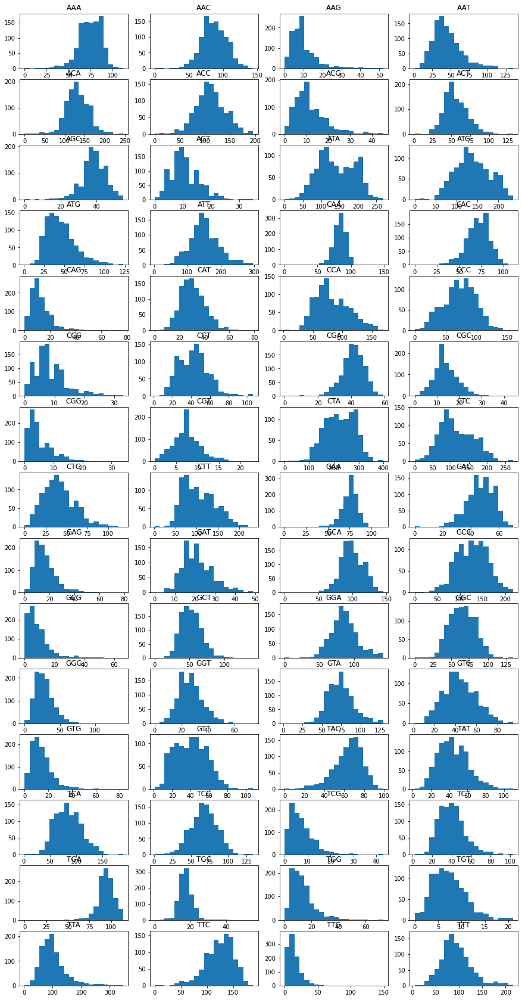

In [447]:
fig, ax = plt.subplots(15, 4, figsize=(15,30))
ax = ax.ravel()
for i in range(60):
    codon = the_matrix.Codon[i]
    ax[i].hist(the_matrix.loc[the_matrix.Codon == codon, 'CodonUsage'], bins=20)
    ax[i].set_title(codon)
plt.show()

In [440]:
glm_dms_sp.loc[:, 'Const'::2]

,Const,TrnaGe,AAUsage,DummyCognate,DummyMutSpecMatch
0,2.684421,0.010752,0.002780,0.147525,0.955151
1,2.737947,0.015330,0.003000,0.094807,0.762163
2,2.823243,-0.004402,0.003353,0.387258,0.782643
3,2.734864,0.006920,0.002854,0.133482,0.935623
4,2.952320,0.009824,0.002747,0.093247,0.623634
...,...,...,...,...,...
1020,2.568339,0.030219,0.003279,0.195706,0.673010
1021,2.924767,-0.016796,0.003213,0.402839,0.903152
1022,2.794080,0.021115,0.002595,-0.044190,0.652059
1023,2.440134,0.024511,0.002824,0.151849,0.918171


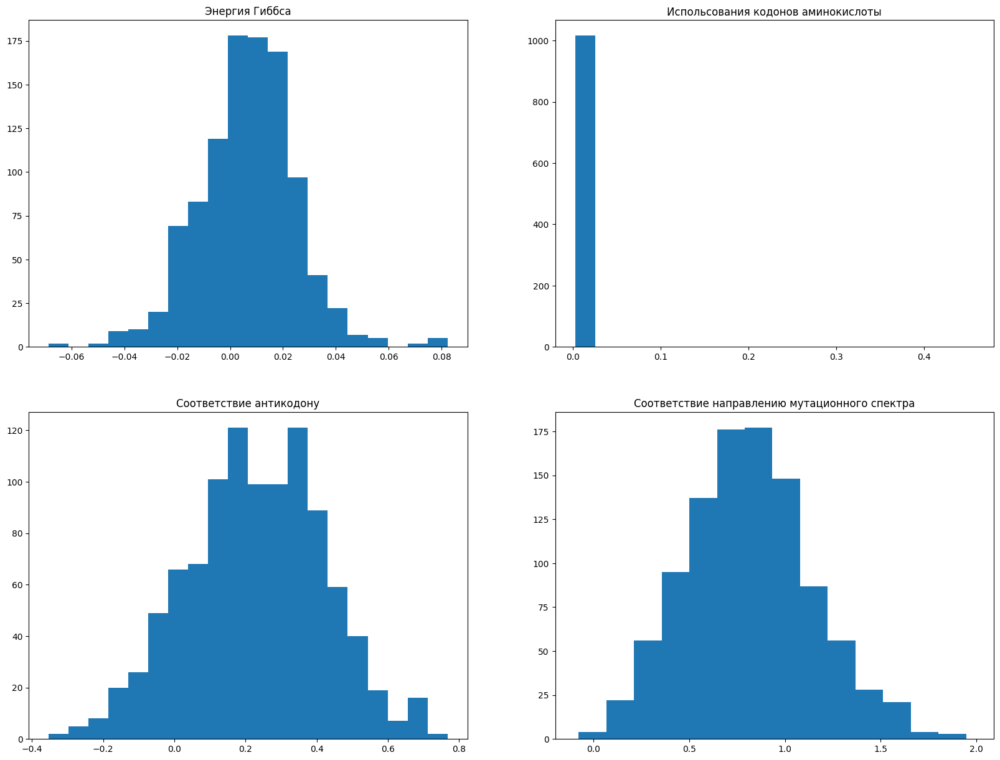

In [18]:
fig, ax = plt.subplots(2,2, figsize=(20,15), facecolor='white')
ax = ax.ravel()
labels = ['Энергия Гиббса', 'Испольсования кодонов аминокислоты', 
          'Соответствие антикодону', 'Соответствие направлению мутационного спектра']
for i, predictor in enumerate(glm_dms_sp.loc[:, 'TrnaGe'::2].columns):
    ax[i].hist(glm_dms_sp.loc[:, predictor], bins=20)
    if i == 3:
        ax[i].set_xlim(-0.2)  
    # ax[i].set_ylabel('')
    # ax[i].set_xlabel('')
    ax[i].set_title(labels[i])

In [19]:
glm_dms_sp

,Species,Const,Const_pv,TrnaGe,TrnaGe_pv,AAUsage,AAUsage_pv,DummyCognate,DummyCognate_pv,DummyMutSpecMatch,DummyMutSpecMatch_pv
0,Abalistes_stellaris,2.684421,0.000000e+00,0.010752,5.055323e-04,0.002780,9.730683e-125,0.147525,4.814273e-04,0.955151,3.427345e-91
1,Ablennes_hians,2.737947,2.385193e-211,0.015330,8.053896e-04,0.003000,1.171397e-118,0.094807,2.725784e-02,0.762163,4.609461e-62
2,Abronia_graminea,2.823243,0.000000e+00,-0.004402,3.220251e-01,0.003353,4.150738e-127,0.387258,1.778586e-19,0.782643,8.004509e-60
3,Abudefduf_vaigiensis,2.734864,2.710178e-167,0.006920,1.494054e-01,0.002854,5.452051e-154,0.133482,1.487110e-03,0.935623,9.517373e-90
4,Acanthaluteres_brownii,2.952320,3.379400e-290,0.009824,1.751049e-02,0.002747,7.700123e-128,0.093247,3.055328e-02,0.623634,6.676153e-44
...,...,...,...,...,...,...,...,...,...,...,...
1012,Zaglossus_bruijni,2.568339,1.275806e-143,0.030219,1.275378e-06,0.003279,8.247966e-122,0.195706,4.716219e-06,0.673010,8.755329e-49
1013,Zalophus_californianus,2.924767,1.889121e-210,-0.016796,4.075118e-03,0.003213,1.817979e-157,0.402839,1.358538e-21,0.903152,1.579778e-77
1014,Zanclus_cornutus,2.794080,7.626099e-275,0.021115,2.196516e-08,0.002595,1.427744e-126,-0.044190,3.083701e-01,0.652059,4.980161e-49
1015,Zebrasoma_flavescens,2.440134,1.390995e-157,0.024511,6.050880e-08,0.002824,2.550570e-152,0.151849,3.622376e-04,0.918171,1.270811e-84


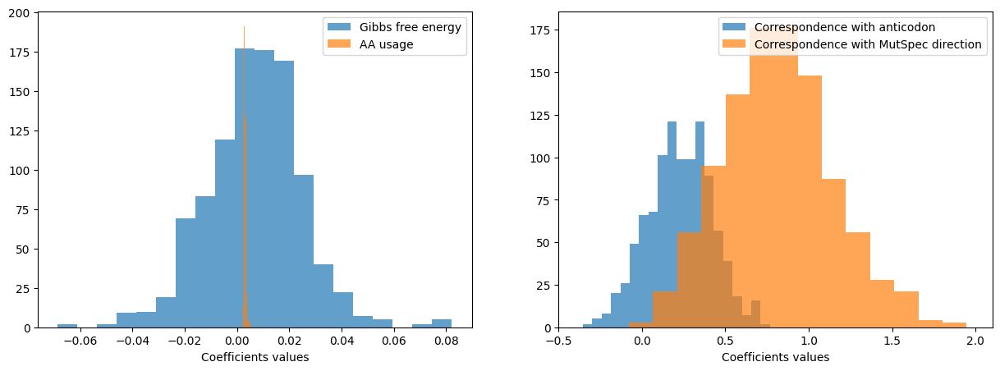

In [30]:
fig, ax = plt.subplots(1, 2, figsize=(15,5), facecolor='white')
ax = ax.ravel()
labels = ['Gibbs free energy', 'AA usage', 
          'Сorrespondence with anticodon', 'Correspondence with MutSpec direction']
for i, predictor in enumerate(glm_dms_sp.loc[:, 'TrnaGe'::2].columns):
    if i in [0, 1]:
        ax[0].hist(glm_dms_sp.loc[:, predictor], bins=20, alpha=0.7, label=labels[i])
        # ax[0].set_title(labels[i])
        ax[0].set_xlabel('Coefficients values')
        ax[0].legend()
        
    else:
        ax[1].hist(glm_dms_sp.loc[:, predictor], bins=20, alpha=0.7, label=labels[i])
        # ax[1].set_title(labels[i])
        ax[1].set_xlabel('Coefficients values')
        ax[1].set_xlim(-0.5, 2.1) 
        ax[1].legend()
    # if i == 3:
    #      
    # ax[i].set_ylabel('')
    # ax[i].set_xlabel('')
    

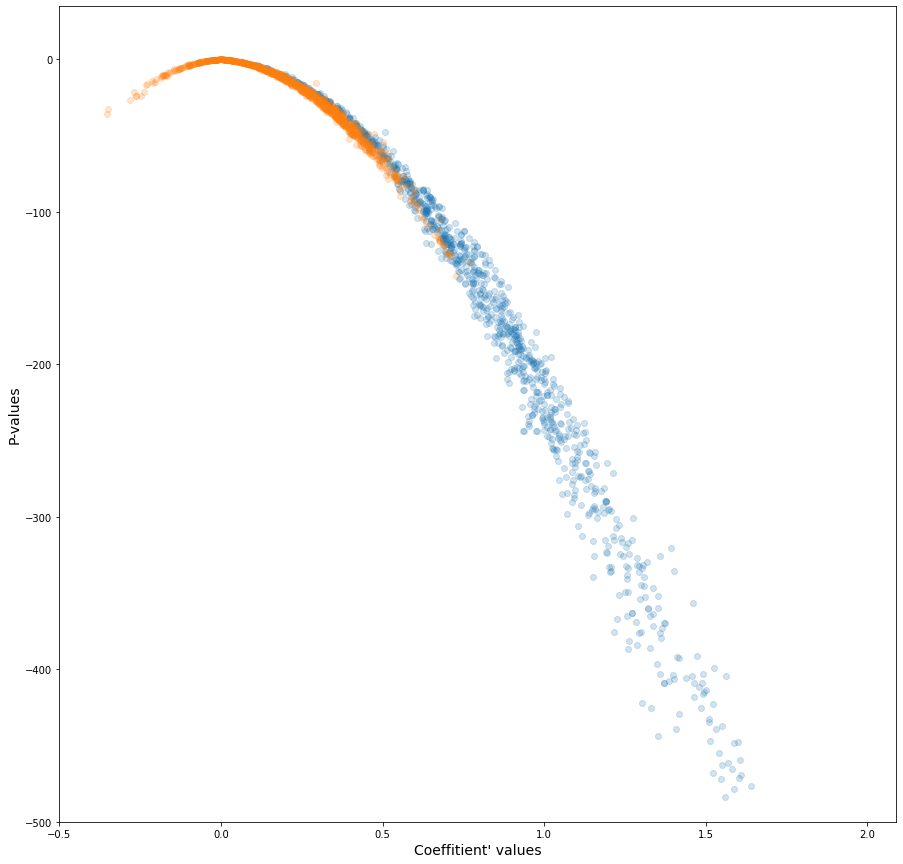

In [529]:
plt.figure(figsize=(15,15), facecolor='white')
plt.scatter(glm_dms_sp.DummyMutSpecMatch, np.log(glm_dms_sp.DummyMutSpecMatch_pv), alpha=0.2)
plt.scatter(glm_dms_sp.DummyCognate, np.log(glm_dms_sp.DummyCognate_pv), alpha=0.2)
plt.ylim(-500,)
plt.xlim(-.5,)
plt.ylabel('P-values', fontsize=14)
plt.xlabel("Coeffitient' values", fontsize=14)
plt.show()

In [512]:
glm_dms_sp.iloc[np.where(glm_dms_sp.DummyMutSpecMatch < -0.5)]



,Species,Const,Const_pv,TrnaGe,TrnaGe_pv,AAUsage,AAUsage_pv,DummyCognate,DummyCognate_pv,DummyMutSpecMatch,DummyMutSpecMatch_pv
30,Albula_glossodonta,3.891184,5.854722e-230,-0.007678,0.228381,0.003348,3.875609e-73,0.295052,1.514244e-07,-0.944406,1.916832e-72


# Cognate-common test

In [331]:
ratio_trna_df = CU_12_fraction[CU_12_fraction.index.isin(trna_cu_df.index)]
ratio_trna_df

,AAA,AAC,AAG,AAT,ACA,ACC,ACG,ACT,AGA,AGC,AGG,AGT,ATA,ATC,ATG,ATT,CAA,CAC,CAG,CAT,CCA,CCC,CCG,CCT,CGA,CGC,CGG,CGT,CTA,CTC,CTG,CTT,GAA,GAC,GAG,GAT,GCA,GCC,GCG,GCT,GGA,GGC,GGG,GGT,GTA,GTC,GTG,GTT,TAA,TAC,TAG,TAT,TCA,TCC,TCG,TCT,TGA,TGC,TGG,TGT,TTA,TTC,TTG,TTT
Species,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Abalistes_stellaris,0.017650,0.022339,0.001931,0.010756,0.034197,0.037231,0.002482,0.010756,0.0,0.012410,0.0,0.002758,0.029233,0.027579,0.011859,0.043574,0.026200,0.020408,0.002206,0.007170,0.020132,0.023718,0.001379,0.012962,0.012962,0.004688,0.000276,0.001655,0.062879,0.037507,0.012410,0.029509,0.022614,0.013238,0.003861,0.006343,0.026475,0.044402,0.001931,0.014892,0.028406,0.017375,0.006343,0.006895,0.024821,0.013514,0.002758,0.010480,0.0,0.019305,0.0,0.008825,0.020960,0.021236,0.001655,0.008825,0.028406,0.005240,0.003309,0.001655,0.029509,0.036404,0.003861,0.025648
Ablennes_hians,0.020954,0.022057,0.000827,0.012683,0.036118,0.031431,0.000551,0.015991,0.0,0.010201,0.0,0.003033,0.033912,0.027571,0.007996,0.055418,0.026744,0.019851,0.000827,0.009374,0.019300,0.022057,0.001379,0.017094,0.013234,0.002757,0.001379,0.002206,0.039978,0.039978,0.004963,0.045216,0.023160,0.011580,0.002481,0.008547,0.031155,0.033361,0.000827,0.017370,0.023435,0.017370,0.004963,0.011856,0.016543,0.013234,0.001379,0.015715,0.0,0.017094,0.0,0.011028,0.019575,0.020678,0.000827,0.012131,0.027847,0.004136,0.002757,0.002206,0.038048,0.031707,0.002757,0.031155
Abronia_graminea,0.022148,0.025194,0.002492,0.016334,0.047619,0.033776,0.002492,0.014950,0.0,0.010520,0.0,0.001661,0.051772,0.043743,0.008029,0.047342,0.027962,0.018272,0.002215,0.010520,0.031838,0.010520,0.002769,0.009967,0.012735,0.003322,0.000277,0.001938,0.068660,0.021041,0.009690,0.026855,0.020210,0.009967,0.003599,0.004983,0.029347,0.027132,0.000000,0.012458,0.025748,0.015227,0.005260,0.008029,0.017719,0.008583,0.002492,0.007752,0.0,0.018272,0.0,0.010520,0.032115,0.014950,0.001661,0.010797,0.025748,0.004430,0.001938,0.003322,0.031838,0.027962,0.002769,0.028516
Abudefduf_vaigiensis,0.021165,0.023364,0.000000,0.008796,0.029137,0.034360,0.004398,0.013194,0.0,0.012919,0.0,0.000275,0.028037,0.034909,0.015393,0.041506,0.025289,0.021440,0.003299,0.007147,0.017317,0.023090,0.001649,0.016767,0.012919,0.002749,0.000825,0.002749,0.057724,0.045080,0.013194,0.034360,0.023914,0.015943,0.002474,0.005223,0.029412,0.044255,0.001924,0.015118,0.023914,0.023914,0.004123,0.006597,0.020341,0.014843,0.002474,0.013744,0.0,0.020616,0.0,0.007147,0.018142,0.020066,0.002474,0.009896,0.028587,0.005223,0.003299,0.001649,0.015943,0.040682,0.002199,0.022815
Acanthaluteres_brownii,0.015690,0.023397,0.004679,0.007707,0.031654,0.030003,0.004129,0.012662,0.0,0.012937,0.0,0.002202,0.013763,0.031654,0.028626,0.037159,0.018167,0.022846,0.006881,0.005780,0.013763,0.025048,0.002753,0.016515,0.008258,0.006881,0.003303,0.001652,0.040462,0.049546,0.018442,0.035233,0.019818,0.014038,0.008258,0.005780,0.027250,0.044867,0.005230,0.020369,0.014864,0.020919,0.016515,0.007432,0.016240,0.020369,0.006056,0.015965,0.0,0.017616,0.0,0.010460,0.015139,0.020919,0.004129,0.010460,0.025048,0.004955,0.006056,0.002477,0.020644,0.037710,0.006331,0.022296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zaglossus_bruijni,0.020741,0.026549,0.003595,0.014381,0.035122,0.027931,0.001936,0.019635,0.0,0.005254,0.0,0.005531,0.040929,0.046184,0.012721,0.043695,0.022400,0.018805,0.002489,0.009126,0.019082,0.019635,0.000830,0.014381,0.008850,0.004701,0.001659,0.002765,0.055863,0.029591,0.011615,0.028485,0.018529,0.008850,0.004978,0.008573,0.018805,0.025719,0.001106,0.017146,0.020465,0.017146,0.008296,0.009679,0.017976,0.012168,0.002489,0.014104,0.0,0.019082,0.0,0.013827,0.029038,0.023230,0.001383,0.010232,0.023783,0.003319,0.004701,0.0033

## Fisher

In [36]:
aa = 'Ala'
ac_typicality = trna_cu_df[aa] == cognate_acs[aa]
ac_ratio_list = []
for species in trna_cu_df[aa].index:  # ratio value for real anticodon for fiven aa and species
    ac = trna_cu_df[aa][species]
    cognate_codon = str(Seq(ac).reverse_complement())
    ac_ratio_list.append(ratio_trna_df.loc[species, cognate_codon])
ac_ratio_series = pd.Series(ac_ratio_list, index=trna_cu_df[aa].index)
ac_most_freq_codon = ac_ratio_series == ratio_trna_df[aa_dict_full[aa]].max(axis=1)
a = (ac_typicality & ac_most_freq_codon).sum()
b = (ac_typicality & ~ac_most_freq_codon).sum()
c = (~ac_typicality & ac_most_freq_codon).sum()
d = (~ac_typicality & ~ac_most_freq_codon).sum()
contingency_table = np.array([[a,b], [c, d]])
contingency_table

array([[213, 787],
       [  0,   2]], dtype=int64)

In [11]:
# max codon == anticodon cognate codon
from scipy.stats import chi2_contingency
from scipy.stats import chisquare
stats_dict = {i:{} for i in ['fisher', 'adj_odds', 'ci', 'chisquare']}
odds_dict = {}
contingency_table_list = []
for aa in cognate_acs:
    ac_typicality = trna_cu_df[aa] == cognate_acs[aa]
    ac_ratio_list = []
    for species in trna_cu_df[aa].index:  # ratio value for real anticodon for fiven aa and species
        ac = trna_cu_df[aa][species]
        cognate_codon = str(Seq(ac).reverse_complement())
        ac_ratio_list.append(ratio_trna_df.loc[species, cognate_codon])
    ac_ratio_series = pd.Series(ac_ratio_list, index=trna_cu_df[aa].index)
    ac_most_freq_codon = ac_ratio_series == ratio_trna_df[aa_dict_full[aa]].max(axis=1)
    a = (ac_typicality & ac_most_freq_codon).sum()
    b = (ac_typicality & ~ac_most_freq_codon).sum()
    c = (~ac_typicality & ac_most_freq_codon).sum()
    d = (~ac_typicality & ~ac_most_freq_codon).sum()
    contingency_table = np.array([[a,b], [c, d]])
    contingency_table_list.append(contingency_table)
    print(contingency_table, aa, sep='\t')

    adjusted_table = contingency_table + 0.5

    # Calculate adjusted odds ratio manually
    odds_treatment = adjusted_table[0, 0] / adjusted_table[0, 1]
    odds_no_treatment = adjusted_table[1, 0] / adjusted_table[1, 1]
    adjusted_or = odds_treatment / odds_no_treatment

    # Calculate the standard error of the log odds ratio
    se_log_or = np.sqrt(1/adjusted_table[0, 0] + 1/adjusted_table[0, 1] + 
                        1/adjusted_table[1, 0] + 1/adjusted_table[1, 1])

    # Calculate the confidence intervals
    z = 1.96  # for 95% confidence interval
    log_or = np.log(adjusted_or)
    ci = z * se_log_or    
    fisher_result = fisher_exact(contingency_table+1)
    chi_result = chi2_contingency(contingency_table+1)
    odds_result = odds_ratio(contingency_table)
    odds_ci = odds_result.confidence_interval()
    stats_dict['fisher'][aa] = fisher_result[1]
    stats_dict['chisquare'][aa] = chi_result[1]
    stats_dict['adj_odds'][aa] = log_or
    stats_dict['ci'][aa] = ci
    odds_dict[aa] = [odds_result.statistic, odds_ci[0], odds_ci[1]]

[[213 787]
 [  0   2]]	Ala
[[982  16]
 [  0   4]]	Arg
[[904  98]
 [  0   0]]	Asn
[[930  71]
 [  0   1]]	Asp
[[940  60]
 [  0   2]]	Cys
[[998   4]
 [  0   0]]	Gln
[[990  11]
 [  0   1]]	Glu
[[718 283]
 [  0   1]]	Gly
[[952  49]
 [  0   1]]	His
[[427 575]
 [  0   0]]	Ile
[[838 164]
 [  0   0]]	Leu1
[[996   6]
 [  0   0]]	Leu2
[[990  12]
 [  0   0]]	Lys
[[ 74 928]
 [  0   0]]	Met
[[719 281]
 [  1   1]]	Phe
[[518 484]
 [  0   0]]	Pro
[[989  12]
 [  0   1]]	Ser1
[[645 357]
 [  0   0]]	Ser2
[[648 354]
 [  0   0]]	Thr
[[998   4]
 [  0   0]]	Trp
[[798 204]
 [  0   0]]	Tyr
[[816 184]
 [  0   2]]	Val


In [32]:
tuple_list = []
for idx, i in enumerate(contingency_table_list):
    t = tuple(contingency_table_list[idx].reshape(4))
    # print(f'tRNA{idx+1} <- matrix(c{t}, nrow = 2)')
    # print(f'list({[f'matrix(c{t}, nrow = 2)' for i in range(22)]})')

# Mantel-Haenszel chi-squared test with continuity correction

# data:  tables
# Mantel-Haenszel X-squared = 96.87, df = 1, p-value < 2.2e-16
# alternative hypothesis: true common odds ratio is not equal to 1
# 95 percent confidence interval:
#    8.618542 254.641559
# sample estimates:
# common odds ratio
#          46.84698

list(matrix(c(213, 787, 0, 2), nrow = 2)),
list(matrix(c(982, 16, 0, 4), nrow = 2)),
list(matrix(c(904, 98, 0, 0), nrow = 2)),
list(matrix(c(930, 71, 0, 1), nrow = 2)),
list(matrix(c(940, 60, 0, 2), nrow = 2)),
list(matrix(c(998, 4, 0, 0), nrow = 2)),
list(matrix(c(990, 11, 0, 1), nrow = 2)),
list(matrix(c(718, 283, 0, 1), nrow = 2)),
list(matrix(c(952, 49, 0, 1), nrow = 2)),
list(matrix(c(427, 575, 0, 0), nrow = 2)),
list(matrix(c(838, 164, 0, 0), nrow = 2)),
list(matrix(c(996, 6, 0, 0), nrow = 2)),
list(matrix(c(990, 12, 0, 0), nrow = 2)),
list(matrix(c(74, 928, 0, 0), nrow = 2)),
list(matrix(c(719, 281, 1, 1), nrow = 2)),
list(matrix(c(518, 484, 0, 0), nrow = 2)),
list(matrix(c(989, 12, 0, 1), nrow = 2)),
list(matrix(c(645, 357, 0, 0), nrow = 2)),
list(matrix(c(648, 354, 0, 0), nrow = 2)),
list(matrix(c(998, 4, 0, 0), nrow = 2)),
list(matrix(c(798, 204, 0, 0), nrow = 2)),
list(matrix(c(816, 184, 0, 2), nrow = 2)),


In [16]:
from statsmodels.stats.contingency_tables import StratifiedTable
cmh_test = StratifiedTable(contingency_table_list)
result = cmh_test.test_null_odds()
result.pvalue == 0

True

In [170]:
# max codon == typical codon
stats_dict = {i:{} for i in ['fisher', 'adj_odds', 'ci']}
odds_dict = {}
for aa in cognate_acs:
    ac_typicality = trna_cu_df[aa] == cognate_acs[aa]
    ac_most_freq_codon = ratio_trna_df[cognate_codons[aa]] == ratio_trna_df[aa_dict_full[aa]].max(axis=1)
    a = (ac_typicality & ac_most_freq_codon).sum()
    b = (ac_typicality & ~ac_most_freq_codon).sum()
    c = (~ac_typicality & ac_most_freq_codon).sum()
    d = (~ac_typicality & ~ac_most_freq_codon).sum()
    contingency_table = np.array([[a,b], [c, d]])

    adjusted_table = contingency_table + 0.5

    # Calculate adjusted odds ratio manually
    odds_treatment = adjusted_table[0, 0] / adjusted_table[0, 1]
    odds_no_treatment = adjusted_table[1, 0] / adjusted_table[1, 1]
    adjusted_or = odds_treatment / odds_no_treatment

    # Calculate the standard error of the log odds ratio
    se_log_or = np.sqrt(1/adjusted_table[0, 0] + 1/adjusted_table[0, 1] + 
                        1/adjusted_table[1, 0] + 1/adjusted_table[1, 1])

    # Calculate the confidence intervals
    z = 1.96  # for 95% confidence interval
    log_or = np.log(adjusted_or)
    ci = z * se_log_or    
    fisher_result = fisher_exact(contingency_table+1)
    odds_result = odds_ratio(contingency_table)
    odds_ci = odds_result.confidence_interval()
    stats_dict['fisher'][aa] = fisher_result[1]
    stats_dict['adj_odds'][aa] = log_or
    stats_dict['ci'][aa] = ci
    odds_dict[aa] = [odds_result.statistic, odds_ci[0], odds_ci[1]]
    print(aa, contingency_table.tolist(), sep='\t')

Ala	[[213, 787], [0, 2]]
Arg	[[982, 16], [4, 0]]
Asn	[[904, 98], [0, 0]]
Asp	[[930, 71], [1, 0]]
Cys	[[940, 60], [2, 0]]
Gln	[[998, 4], [0, 0]]
Glu	[[990, 11], [1, 0]]
Gly	[[718, 283], [0, 1]]
His	[[952, 49], [1, 0]]
Ile	[[427, 575], [0, 0]]
Leu1	[[838, 164], [0, 0]]
Leu2	[[996, 6], [0, 0]]
Lys	[[990, 12], [0, 0]]
Met	[[74, 928], [0, 0]]
Phe	[[719, 281], [1, 1]]
Pro	[[518, 484], [0, 0]]
Ser1	[[989, 12], [1, 0]]
Ser2	[[645, 357], [0, 0]]
Thr	[[648, 354], [0, 0]]
Trp	[[998, 4], [0, 0]]
Tyr	[[798, 204], [0, 0]]
Val	[[816, 184], [2, 0]]


In [23]:
stats_dict['chisquare']

{'Ala': 1.0,
 'Arg': 2.114719554712574e-34,
 'Asn': 0.4761442462987868,
 'Asp': 0.004602306776445355,
 'Cys': 4.040073720013735e-06,
 'Gln': 7.234894011722532e-06,
 'Glu': 6.120384646886313e-13,
 'Gly': 0.40681804738744076,
 'His': 0.00044399981913274713,
 'Ile': 1.0,
 'Leu1': 0.7458394286192225,
 'Leu2': 0.00011442831788890076,
 'Lys': 0.0043318363035650875,
 'Met': 0.3500497232409997,
 'Phe': 0.6798391476400818,
 'Pro': 1.0,
 'Ser1': 3.838876183973189e-12,
 'Ser2': 1.0,
 'Thr': 1.0,
 'Trp': 7.234894011722532e-06,
 'Tyr': 0.8739331634263734,
 'Val': 0.024301475373831045}

In [15]:
stats_dict['fisher']

{'Ala': 1.0,
 'Arg': 1.8322834169391407e-08,
 'Asn': 0.18901516275481436,
 'Asp': 0.015262861789836588,
 'Cys': 0.0009401537680064468,
 'Gln': 0.011898756713450637,
 'Glu': 0.000535740188115524,
 'Gly': 0.19625211211177362,
 'His': 0.00760794098464455,
 'Ile': 1.0,
 'Leu1': 0.30292869647784926,
 'Leu2': 0.015849183505929593,
 'Lys': 0.027652987547352695,
 'Met': 0.14545562446218213,
 'Phe': 0.31711089430009093,
 'Pro': 1.0,
 'Ser1': 0.0006177479926293461,
 'Ser2': 1.0,
 'Thr': 1.0,
 'Trp': 0.011898756713450637,
 'Tyr': 0.3677734587499875,
 'Val': 0.02220307322676018}

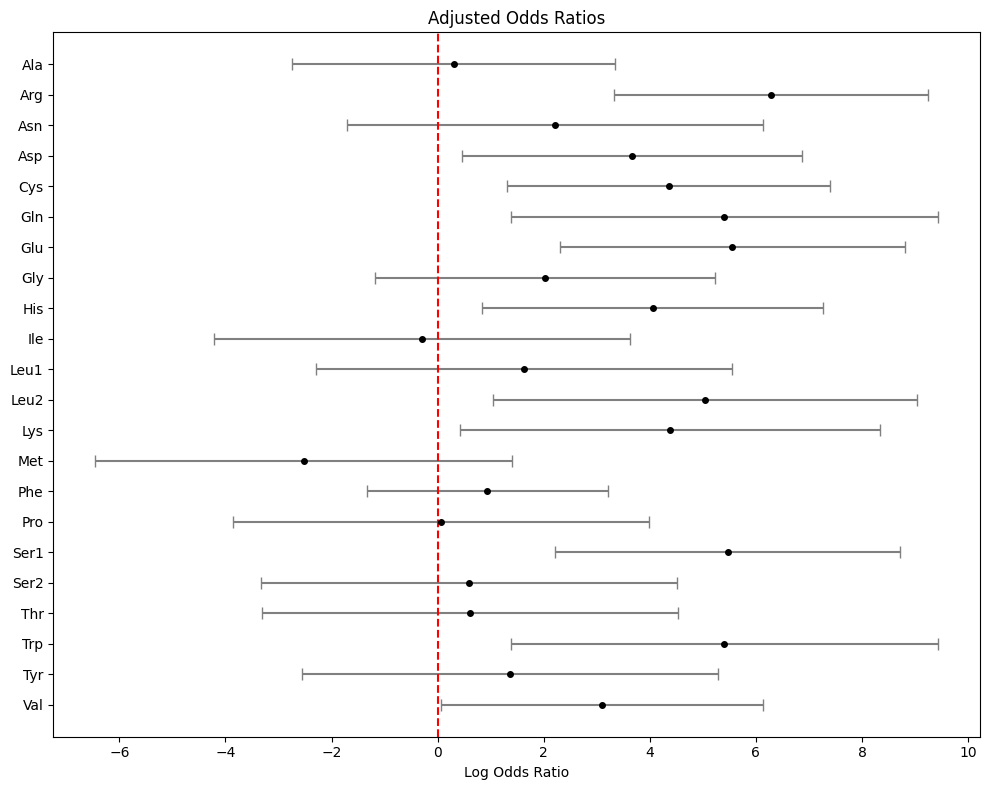

In [173]:
aas = [f"{aa}" for aa in stats_dict['adj_odds'].keys()]
or_list = list(stats_dict['adj_odds'].values())
ci_list = list(stats_dict['ci'].values())

fig, ax = plt.subplots(figsize=(10, 8), facecolor='white')
ax.errorbar(or_list, range(len(or_list)), xerr=ci_list, fmt='o', color='black', ecolor='gray', capsize=4, markersize=4)
ax.axvline(x=0, color='red', linestyle='--')
ax.set_yticks(range(len(aas)))
ax.set_yticklabels(aas)
ax.set_xlabel('Log Odds Ratio')
ax.set_title('Adjusted Odds Ratios')
ax.invert_yaxis()
plt.tight_layout()
plt.show()

## wilcoxon/binomial

In [25]:
trna_cu_df

AA,Ala,Arg,Asn,Asp,Cys,Gln,Glu,Gly,His,Ile,...,Lys,Met,Phe,Pro,Ser1,Ser2,Thr,Trp,Tyr,Val
Species,,,,,,,,,,,,,,,,,,,,,
Abalistes_stellaris,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,...,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Ablennes_hians,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,...,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Abronia_graminea,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,...,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Abudefduf_vaigiensis,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,...,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Acanthaluteres_brownii,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,...,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zaglossus_bruijni,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,...,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Zalophus_californianus,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,...,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Zanclus_cornutus,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,...,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC


In [22]:
binom_dict = {}
for aa in cognate_acs:
    # ac_typicality = trna_cu_df[aa] == aa_cognate_ac[aa]
    ac_ratio_list = []
    for species in trna_cu_df[aa].index:  # ratio value for real anticodon for fiven aa and species
        ac = trna_cu_df[aa][species]
        cognate_codon = str(Seq(ac).reverse_complement())
        ac_ratio_list.append(ratio_trna_df.loc[species, cognate_codon])
    ac_ratio_series = pd.Series(ac_ratio_list, index=trna_cu_df[aa].index)
    ac_most_freq_codon = ac_ratio_series == ratio_trna_df[aa_dict_full[aa]].max(axis=1)
    binom_result = binomtest(ac_most_freq_codon.sum(), len(trna_cu_df), 1/len(aa_dict_full[aa]), alternative='greater')
    print(ac_most_freq_codon.sum(), aa, len(aa_dict_full[aa]))
    binom_dict[aa] = binom_result.pvalue
binom_dict

213 Ala 4
982 Arg 4
904 Asn 2
930 Asp 2
940 Cys 2
998 Gln 2
990 Glu 2
718 Gly 4
952 His 2
427 Ile 2
838 Leu1 4
996 Leu2 2
990 Lys 2
74 Met 2
720 Phe 2
518 Pro 4
989 Ser1 2
645 Ser2 4
648 Thr 4
998 Trp 2
798 Tyr 2
816 Val 4


{'Ala': 0.9975741470563075,
 'Arg': 0.0,
 'Asn': 2.5001217245438395e-164,
 'Asp': 3.492699496952142e-191,
 'Cys': 1.3076634341062773e-202,
 'Gln': 9.780049239192249e-292,
 'Glu': 4.7270394050485096e-275,
 'Gly': 1.4988796933914909e-210,
 'His': 2.5805852078261087e-217,
 'Ile': 0.999998794044453,
 'Leu1': 0.0,
 'Leu2': 3.25030172078901e-287,
 'Lys': 4.7270394050485096e-275,
 'Met': 1.0,
 'Phe': 4.464422430962375e-45,
 'Pro': 4.0462200726242515e-73,
 'Ser1': 3.6035474548894525e-273,
 'Ser2': 9.495091456609383e-152,
 'Thr': 5.8411866342251116e-154,
 'Trp': 9.780049239192249e-292,
 'Tyr': 7.899485576510221e-84,
 'Val': 6.700655107944011e-308}

## TukeyHSP

In [285]:
codon_redundancy = {group:[] for group in ['4_fold', '2_fold_AG', '2_fold_CT']}
codon_redundancy['4_fold'] = ['Ala', 'Arg','Gly', 'Leu1', 'Pro', 'Ser2', 'Thr', 'Val']
codon_redundancy['2_fold_AG'] = ['Gln', 'Glu', 'Leu2', 'Lys', 'Met', 'Trp']
codon_redundancy['2_fold_CT'] = ['Asn', 'Asp', 'Cys', 'His', 'Ile', 'Phe', 'Ser1', 'Tyr']

In [332]:
trna_cu_df

AA,Ala,Arg,Asn,Asp,Cys,Gln,Glu,Gly,His,Ile,Leu1,Leu2,Lys,Met,Phe,Pro,Ser1,Ser2,Thr,Trp,Tyr,Val
Species,,,,,,,,,,,,,,,,,,,,,,
Abalistes_stellaris,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Ablennes_hians,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Abronia_graminea,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Abudefduf_vaigiensis,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Acanthaluteres_brownii,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zaglossus_bruijni,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Zalophus_californianus,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Zanclus_cornutus,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC


In [333]:
trna_cu_df[(trna_cu_df==cognate_acs.values()).all(axis=1)]

AA,Ala,Arg,Asn,Asp,Cys,Gln,Glu,Gly,His,Ile,Leu1,Leu2,Lys,Met,Phe,Pro,Ser1,Ser2,Thr,Trp,Tyr,Val
Species,,,,,,,,,,,,,,,,,,,,,,
Abalistes_stellaris,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Ablennes_hians,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Abronia_graminea,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Abudefduf_vaigiensis,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Acanthaluteres_brownii,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zaglossus_bruijni,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Zalophus_californianus,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC
Zanclus_cornutus,TGC,TCG,GTT,GTC,GCA,TTG,TTC,TCC,GTG,GAT,TAG,TAA,TTT,CAT,GAA,TGG,GCT,TGA,TGT,TCA,GTA,TAC


In [286]:
def tukey_plot(aa_list, exclude_exp=True):
    if len(aa_list) == 22:
        fig, ax = plt.subplots(4, 3, figsize=(6,8), facecolor='white', dpi=300)  # 
    elif len(aa_list) == 8:
        fig, ax = plt.subplots(2, 4, figsize=(4,20), facecolor='white', dpi=300)  # 
    elif len(aa_list) == 6:
        fig, ax = plt.subplots(2, 3, figsize=(4,12), facecolor='white', dpi=300)  # 
    ax = ax.ravel()
    if exclude_exp:
        data = trna_cu_df[(trna_cu_df==cognate_acs.values()).all(axis=1)]
    else:
        data = trna_cu_df
    for i, aa in enumerate(aa_list):
        # ac_ratio_list = []  # extraction ratio values for real cognate codon for given aa and species 
        # for species in data[aa].index:  
        #     ac = data[aa][species]
        #     cognate_codon = str(Seq(ac).reverse_complement())
        #     ac_ratio_list.append(ratio_trna_df.loc[species, cognate_codon])
        # ac_ratio_series = pd.Series(ac_ratio_list, index=data[aa].index)
        cognate_codon = str(Seq(cognate_acs[aa]).reverse_complement())
        codons_series_list = [ratio_trna_df.loc[data.index, codon] for codon in aa_dict_full[aa]]
        if len(aa_dict_full[aa])==4:
            anova_result = f_oneway(codons_series_list[0], codons_series_list[1], codons_series_list[2], codons_series_list[3])
            groups = [aa_dict_full[aa][0]]*len(data) + [aa_dict_full[aa][1]]*len(data) + [aa_dict_full[aa][2]]*len(data) + [aa_dict_full[aa][3]]*len(data)
        else:
            anova_result = f_oneway(codons_series_list[0], codons_series_list[1])
            groups = [aa_dict_full[aa][0]]*len(data) + [aa_dict_full[aa][1]]*len(data)
        if anova_result.pvalue < 0.05:
            tukey_result = pairwise_tukeyhsd(pd.concat(codons_series_list), groups)
        tukey_dict[aa] = tukey_result.pvalues
        anova_dict[aa] = anova_result.pvalue
        tukey_result.plot_simultaneous(comparison_name=cognate_codon, ax=ax[i])
        if aa == 'Ser1':
            aa = 'Ser(AGY)'
        elif aa == 'Ser2':
            aa = 'Ser(TCN)'
        elif aa == 'Leu1':
            aa = 'Leu(CTN)'
        elif aa == 'Leu2':
            aa = 'Leu(TTR)'
        ax[i].set_title(f'{aa}')
        ax[i].set_xlim(left=0)
    plt.subplots_adjust(wspace=0.3, hspace=0.5, bottom=0.5)
    if len(aa_list) == 6:
        plt.subplots_adjust(right=0.7)
    plt.show()

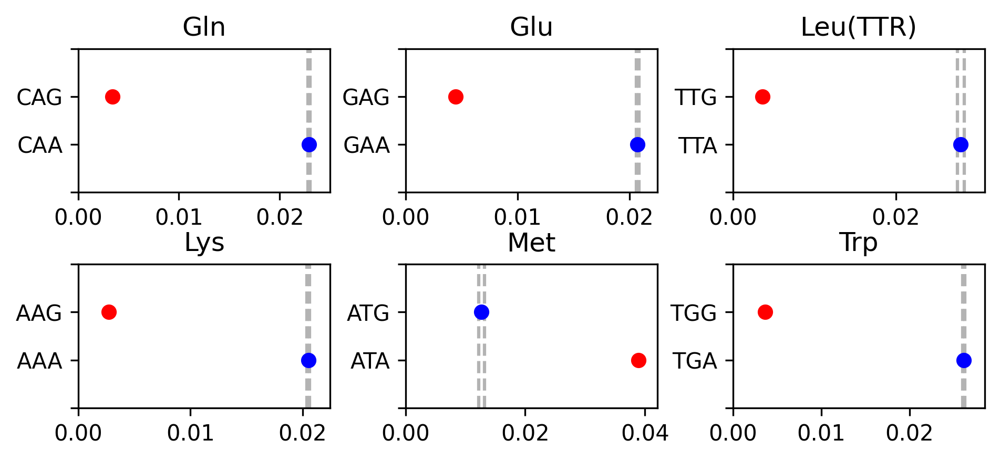

In [334]:
tukey_dict = {}
anova_dict = {}
tukey_plot(codon_redundancy['2_fold_AG'])

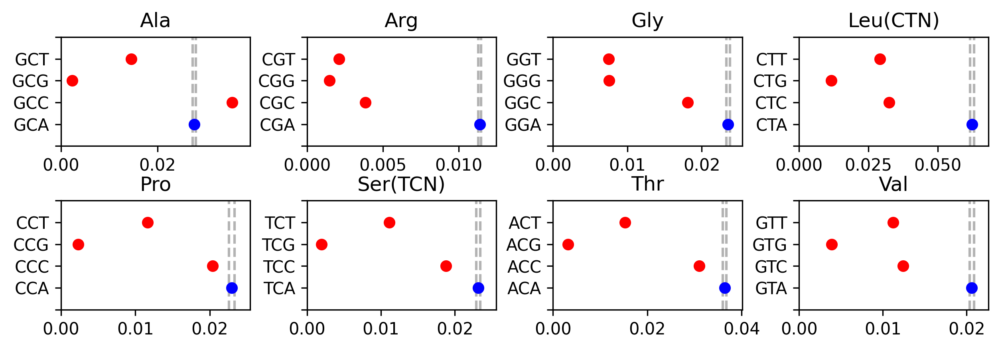

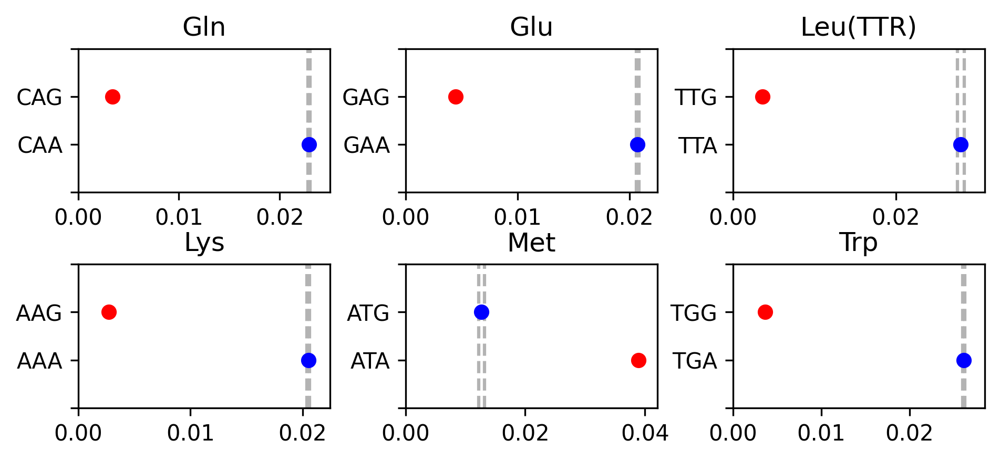

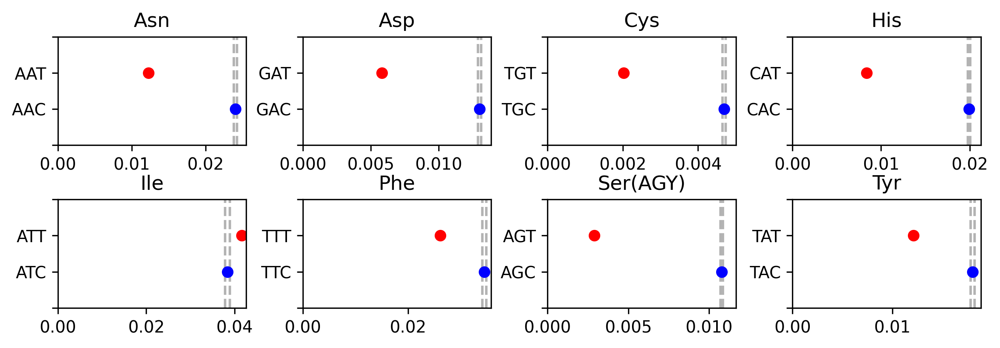

In [335]:
for degeneracy in codon_redundancy:
    tukey_dict = {}
    tukey_plot(codon_redundancy[degeneracy])
    # print(tukey_dict)

<Axes: >

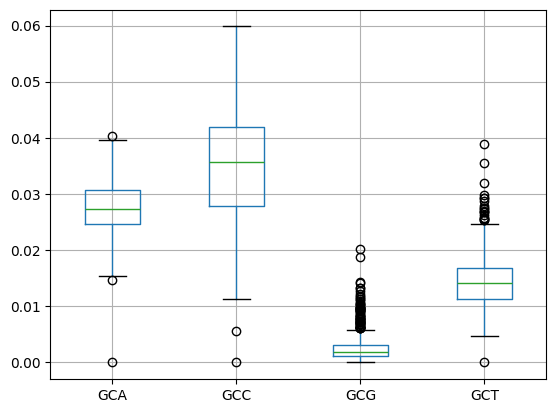

In [49]:
dic = ratio_trna_df.loc[:, 'GCA':'GCT'].to_dict()
ratio_trna_df.loc[:, 'GCA':'GCT'].boxplot()

In [57]:
res = tukey_hsd(list(dic['GCA'].values()), list(dic['GCC'].values()), list(dic['GCG'].values()), list(dic['GCT'].values()))
print(res)


Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)     -0.008     0.000    -0.008    -0.007
 (0 - 2)      0.025     0.000     0.024     0.026
 (0 - 3)      0.013     0.000     0.012     0.014
 (1 - 0)      0.008     0.000     0.007     0.008
 (1 - 2)      0.033     0.000     0.032     0.033
 (1 - 3)      0.021     0.000     0.020     0.021
 (2 - 0)     -0.025     0.000    -0.026    -0.024
 (2 - 1)     -0.033     0.000    -0.033    -0.032
 (2 - 3)     -0.012     0.000    -0.013    -0.011
 (3 - 0)     -0.013     0.000    -0.014    -0.012
 (3 - 1)     -0.021     0.000    -0.021    -0.020
 (3 - 2)      0.012     0.000     0.011     0.013



In [40]:
data = trna_cu_df[(trna_cu_df==cognate_acs.values()).all(axis=1)]
for aa in aa_dict_full:
    codons_series_list = [ratio_trna_df.loc[data.index, codon] for codon in aa_dict_full[aa]]
    if len(aa_dict_full[aa]) == 4:
        groups = [aa_dict_full[aa][0]]*len(data) + [aa_dict_full[aa][1]]*len(data) + [aa_dict_full[aa][2]]*len(data) + [aa_dict_full[aa][3]]*len(data)
    else:
        groups = [aa_dict_full[aa][0]]*len(data) + [aa_dict_full[aa][1]]*len(data)
    res = pairwise_tukeyhsd(pd.concat(codons_series_list), groups)
    print(aa)
    print(res)
# res.plot_simultaneous()

Phe
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower  upper  reject
--------------------------------------------------
   TTC    TTT  -0.0078   0.0 -0.0085 -0.007   True
--------------------------------------------------
Leu2
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
   TTA    TTG  -0.0243   0.0 -0.0252 -0.0235   True
---------------------------------------------------
Ser2
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
   TCA    TCC  -0.0044   0.0  -0.005 -0.0039   True
   TCA    TCG   -0.021   0.0 -0.0216 -0.0205   True
   TCA    TCT  -0.0119   0.0 -0.0125 -0.0114   True
   TCC    TCG  -0.0166   0.0 -0.0172 -0.0161   True
   TCC    TCT  -0.0075   0.0 -0.0081  -0.007   True
   TCG    TCT   0.0091   0.0  0.0086  0.0097   True
--

In [17]:
tukey_dict

{'Ala': array([1.1967094e-12, 1.1967094e-12, 1.1967094e-12, 1.1967094e-12,
        1.1967094e-12, 1.1967094e-12]),
 'Arg': array([1.1967094e-12, 1.1967094e-12, 1.1967094e-12, 1.1967094e-12,
        1.1967094e-12, 1.1967094e-12]),
 'Asn': array([2.76889622e-13]),
 'Asp': array([2.76889622e-13]),
 'Cys': array([2.76889622e-13]),
 'Gln': array([2.76889622e-13]),
 'Glu': array([2.76889622e-13]),
 'Gly': array([1.19670940e-12, 1.19670940e-12, 1.19670940e-12, 1.19670940e-12,
        1.19670940e-12, 8.65741902e-01]),
 'His': array([2.76889622e-13]),
 'Ile': array([4.57356375e-12]),
 'Leu1': array([1.19670940e-12, 1.19670940e-12, 1.19670940e-12, 1.19670940e-12,
        7.60817386e-08, 1.19670940e-12]),
 'Leu2': array([2.76889622e-13])}

In [34]:
ttest_ind(ratio_trna_df[aa_dict_full['Ile'][0]], ratio_trna_df[aa_dict_full['Ile'][1]])

TtestResult(statistic=6.91294508650663, pvalue=6.359280664645147e-12, df=2002.0)

In [33]:
f_oneway(ratio_trna_df[aa_dict_full['Ile'][0]], ratio_trna_df[aa_dict_full['Ile'][1]])

F_onewayResult(statistic=47.78880976905623, pvalue=6.359280664640052e-12)

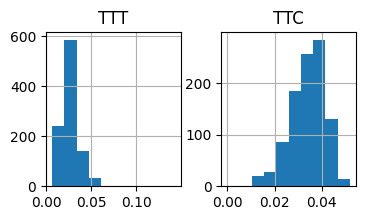

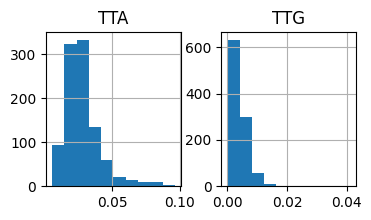

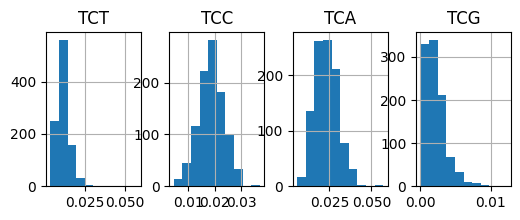

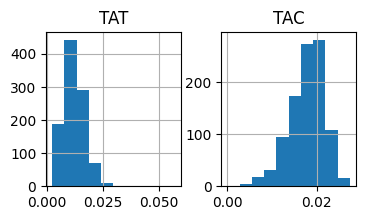

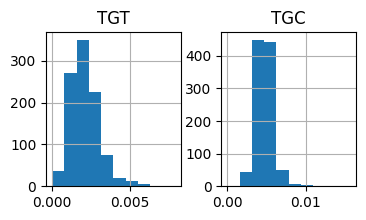

...

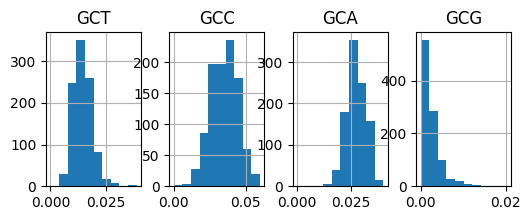

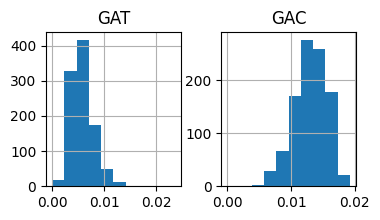

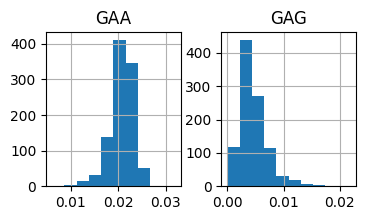

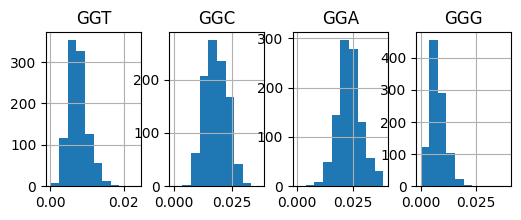

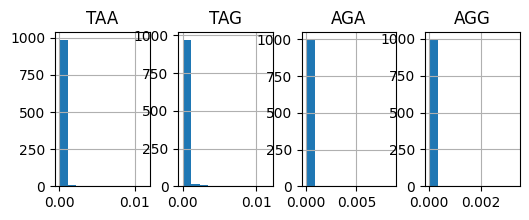

In [41]:
for aa in aa_dict_full:
    if len(aa_dict_full[aa]) == 2:
        ratio_trna_df.loc[:, aa_dict_full[aa]].hist(figsize=(4, 2))
    else:
        ratio_trna_df.loc[:, aa_dict_full[aa]].hist(figsize=(6, 2), layout=(1 ,4))
    plt.show()

In [221]:
for atypical_ac_species_dict

{'Chaunax_abei': ['Ala_Ac', 'CGC'],
 'Chaunax_tosaensis': ['Ala_Ac', 'CGC'],
 'Cyclemys_atripons': ['Arg_Ac', 'CCG'],
 'Odontobutis_platycephala': ['Arg_Ac', 'CCG'],
 'Ciona_intestinalis': ['Gly_Ac', 'TCT', 'Met_Ac', 'TAT'],
 'Cervus_nippon_yakushimae': ['Phe_Ac', 'AAA'],
 'Canis_lupus_laniger': ['Val_Ac', 'CAC'],
 'Chlamydosaurus_kingii': ['Val_Ac', 'AAC'],
 'Pseudalutarius_nasicornis': ['Phe_Ac', 'AAA']}